# The Notebook is divided into 3 parts:
## 1- General dataframe cleaning:
## 2- PROJECT 1
## 3- PROJECT 2

# ----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import re
import matplotlib.pyplot as plt

# General dataframe cleaning:

In [2]:
df = pd.read_csv("Survey_2020.csv")
df.head()

,Timestamp,Age,Gender,City,Position,Total years of experience,Years of experience in Germany,Seniority level,Your main technology / programming language,Other technologies/programming languages you use often,...,Annual bonus+stocks one year ago. Only answer if staying in same country,Number of vacation days,Employment status,Сontract duration,Main language at work,Company size,Company type,Have you lost your job due to the coronavirus outbreak?,"Have you been forced to have a shorter working week (Kurzarbeit)? If yes, how many hours per week","Have you received additional monetary support from your employer due to Work From Home? If yes, how much in 2020 in EUR"
0,24/11/2020 11:14:15,26.0,Male,Munich,Software Engineer,5,3,Senior,TypeScript,"Kotlin, Javascript / Typescript",...,10000,30,Full-time employee,Unlimited contract,English,51-100,Product,No,NaN,NaN
1,24/11/2020 11:14:16,26.0,Male,Berlin,Backend Developer,7,4,Senior,Ruby,NaN,...,5000,28,Full-time employee,Unlimited contract,English,101-1000,Product,No,NaN,NaN
2,24/11/2020 11:14:21,29.0,Male,Berlin,Software Engineer,12,6,Lead,Javascript / Typescript,"Javascript / Typescript, Docker",...,100000,30,Self-employed (freelancer),Temporary contract,English,101-1000,Product,Yes,NaN,NaN
3,24/11/2020 11:15:24,28.0,Male,Berlin,Frontend Developer,4,1,Junior,Javascript,NaN,...,NaN,24,Full-time employee,Unlimited contract,English,51-100,Startup,No,NaN,NaN
4,24/11/2020 11:15:46,37.0,Male,Berlin,Backend Developer,17,6,Senior,C# .NET,".NET, SQL, AWS, Docker",...,NaN,29,Full-time employee,Unlimited contract,English,101-1000,Product,No,NaN,NaN


In [3]:
df.isna().sum()

Timestamp                                                                                                                    0
Age                                                                                                                         27
Gender                                                                                                                      10
City                                                                                                                         0
Position                                                                                                                     6
Total years of experience                                                                                                   16
Years of experience in Germany                                                                                              32
Seniority level                                                                                                

In [4]:
##GENERAL DATAFRAME CLEANING
#Drop last 2 columns(Irrelevant info)
#Remove all outliers in position titles that have occurred less than three
#Remove all outliers in salary by quantiling
#Change null bonus values to 0 in 'Yearly Bonus'
#Drop brutto salary and bonus one year ago(Too many null values make the info irrelevant)

df.drop(['Have you been forced to have a shorter working week (Kurzarbeit)? If yes, how many hours per week', 'Have you received additional monetary support from your employer due to Work From Home? If yes, how much in 2020 in EUR','Annual bonus+stocks one year ago. Only answer if staying in same country', 'Annual brutto salary (without bonus and stocks) one year ago. Only answer if staying in the same country'], axis=1)
df.rename(columns = {"Position ":"Position"})

q1 = df['Yearly brutto salary (without bonus and stocks) in EUR'].quantile(0.25)
q3 = df['Yearly brutto salary (without bonus and stocks) in EUR'].quantile(0.75)

iqr = q3 - q1
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr
df = df[(df['Yearly brutto salary (without bonus and stocks) in EUR'] >= lower_bound) & (df['Yearly brutto salary (without bonus and stocks) in EUR'] <= upper_bound)]


In [5]:
print(df.iloc[3]['Yearly brutto salary (without bonus and stocks) in EUR'])
df['Yearly bonus + stocks in EUR'] = df['Yearly bonus + stocks in EUR'].fillna(0)

62000.0


In [6]:
df['Yearly bonus + stocks in EUR'].isna().sum()

0

In [7]:
df['Position '].unique()

array(['Software Engineer', 'Backend Developer', 'Frontend Developer',
       'DevOps', 'Data Engineer', 'Designer (UI/UX)', 'Product Manager',
       'Mobile Developer', 'Software Architect', 'Team Lead',
       'Test manager', 'QA Engineer', 'Hardware Engineer',
       'Data Scientist', 'Engineering Manager', 'Analytics engineer',
       'Localization producer', 'Reporting Engineer', 'Account Managet',
       'agile master ', 'Solution Architect', 'BI Consultant',
       'Fullstack Developer', 'System Administrator', 'Project Manager',
       'Network Engineer ', 'VP Engineering', 'Agile Coach',
       'ML Engineer', 'Data Science Manager', 'Scrum Master',
       'Firmware Engineer', 'Solutions Architect', 'Data Center Manager',
       'C/C++/Java developer', 'DevOps Manager', 'Tech Lead',
       'Network Administrator', 'Security Manager',
       'Consultant Data Analytics', 'BI IT Consultant',
       'Graphic Designer', 'iOS Developer', 'Banker', 'Cloud Engineer',
       'Solutions

In [8]:
jobs = [df['Position '].value_counts()]

In [9]:
jobs

[Software Engineer            365
 Backend Developer            163
 Data Scientist               102
 Frontend Developer            86
 QA Engineer                   69
                             ... 
 Recruiter                      1
 DBA                            1
 DB developer/Data analyst      1
 Stuttgart                      1
 IT Operations Manager          1
 Name: Position , Length: 134, dtype: int64]

In [10]:
pd.set_option('display.max_rows', None)

In [11]:
df.drop(['Have you received additional monetary support from your employer due to Work From Home? If yes, how much in 2020 in EUR', 'Have you been forced to have a shorter working week (Kurzarbeit)? If yes, how many hours per week'], axis=1, inplace=True)

In [12]:
df['Position '].unique()

array(['Software Engineer', 'Backend Developer', 'Frontend Developer',
       'DevOps', 'Data Engineer', 'Designer (UI/UX)', 'Product Manager',
       'Mobile Developer', 'Software Architect', 'Team Lead',
       'Test manager', 'QA Engineer', 'Hardware Engineer',
       'Data Scientist', 'Engineering Manager', 'Analytics engineer',
       'Localization producer', 'Reporting Engineer', 'Account Managet',
       'agile master ', 'Solution Architect', 'BI Consultant',
       'Fullstack Developer', 'System Administrator', 'Project Manager',
       'Network Engineer ', 'VP Engineering', 'Agile Coach',
       'ML Engineer', 'Data Science Manager', 'Scrum Master',
       'Firmware Engineer', 'Solutions Architect', 'Data Center Manager',
       'C/C++/Java developer', 'DevOps Manager', 'Tech Lead',
       'Network Administrator', 'Security Manager',
       'Consultant Data Analytics', 'BI IT Consultant',
       'Graphic Designer', 'iOS Developer', 'Banker', 'Cloud Engineer',
       'Solutions

In [13]:
df['Yearly brutto salary (without bonus and stocks) in EUR'].min()

27000.0

In [14]:
mask = df.groupby('Position ')['Position '].transform('size') >= 3
df = df.loc[mask,:]

In [15]:
df['Position '].unique()

array(['Software Engineer', 'Backend Developer', 'Frontend Developer',
       'DevOps', 'Data Engineer', 'Designer (UI/UX)', 'Product Manager',
       'Mobile Developer', 'Team Lead', 'QA Engineer',
       'Hardware Engineer', 'Data Scientist', 'Engineering Manager',
       'Fullstack Developer', 'ML Engineer', 'Business Analyst',
       'Consultant', 'SRE', 'Data Analyst', 'CTO'], dtype=object)

# Project 1



# Are years of experience in Germany on average more valuable than years of experience outside of Germany?



In [16]:
#Dataframe cleaning for unnecessary data
#Drrop all columns except 'Total years of experience','Years of experience in Germany','Seniority level','Yearly brutto salary (without bonus and stocks) in EUR','Yearly bonus + stocks in EUR'.
#new data frame have only 5 columns (df)
df40 = df.drop(['Timestamp', 'Age', 'Gender', 'City', 'Position ',
       'Your main technology / programming language',
       'Other technologies/programming languages you use often',
       'Annual brutto salary (without bonus and stocks) one year ago. Only answer if staying in the same country',
       'Annual bonus+stocks one year ago. Only answer if staying in same country',
       'Number of vacation days', 'Employment status', 'Сontract duration',
       'Main language at work', 'Company size', 'Company type',
       'Have you lost your job due to the coronavirus outbreak?'], axis=1)
df40.head()

,Total years of experience,Years of experience in Germany,Seniority level,Yearly brutto salary (without bonus and stocks) in EUR,Yearly bonus + stocks in EUR
0,5,3,Senior,80000.0,5000
1,7,4,Senior,80000.0,0
3,4,1,Junior,54000.0,0
4,17,6,Senior,62000.0,0
5,5,1,Senior,76000.0,5000


In [17]:
#convert null values in "Total years of experience" and "Years of experience in Germany	" TO 0
df40['Total years of experience']=df40['Total years of experience'].fillna(0)
df40['Years of experience in Germany']=df40['Years of experience in Germany'].fillna(0)


In [18]:
#Display random values to check the null values convert to Zero
df40.sample(7,random_state=0)

,Total years of experience,Years of experience in Germany,Seniority level,Yearly brutto salary (without bonus and stocks) in EUR,Yearly bonus + stocks in EUR
1070,4,2,Middle,73700.0,80400
872,4,4,Senior,100000.0,100000
910,2,2,Junior,65000.0,0
939,22,0,Head,50000.0,0
1059,5,1,Middle,50000.0,50000
1215,14,4,Lead,95000.0,5000
493,14,2.5,Senior,77000.0,0


In [19]:
#null values in the new data frame
df40.isnull().sum()
#after drop the null values and convert it to zero

Total years of experience                                 0
Years of experience in Germany                            0
Seniority level                                           8
Yearly brutto salary (without bonus and stocks) in EUR    0
Yearly bonus + stocks in EUR                              0
dtype: int64

In [20]:
#Drop the null values in the seniority level
df40 = df40.dropna(subset=['Seniority level'])

In [21]:
mask = df40['Years of experience in Germany'].isin(['0','1', '2', '3', '4', '5'])
df40.loc[mask, 'Years of experience in Germany'] = 'less than 5 years'
mask1 = df40['Years of experience in Germany'].isin(['5', '6', '7', '8', '9','10','11','12','13','14','20','30'])
df40.loc[mask1, 'Years of experience in Germany'] = 'greater than 5 years'
df40

,Total years of experience,Years of experience in Germany,Seniority level,Yearly brutto salary (without bonus and stocks) in EUR,Yearly bonus + stocks in EUR
0,5,less than 5 years,Senior,80000.0,5000
1,7,less than 5 years,Senior,80000.0,0
3,4,less than 5 years,Junior,54000.0,0
4,17,greater than 5 years,Senior,62000.0,0
5,5,less than 5 years,Senior,76000.0,5000
6,6,0.4,Middle,57000.0,0
7,5,less than 5 years,Senior,65000.0,0
8,8,less than 5 years,Senior,56000.0,0
9,15,less than 5 years,Lead,95000.0,0
10,2,less than 5 years,Junior,52500.0,0


In [22]:
counts = df40['Years of experience in Germany'].value_counts()
counts

less than 5 years                                      766
greater than 5 years                                   165
1.5                                                     22
0                                                       20
0.5                                                     11
2.5                                                     10
3.5                                                      8
15                                                       7
1,5                                                      4
0,5                                                      4
19                                                       2
0.25                                                     2
3,5                                                      2
0.1                                                      1
4.5                                                      1
3 (in Poland)                                            1
2.6                                                     

In [23]:
values_to_drop = counts[counts == 1].index.tolist()
mask = df40['Years of experience in Germany'].isin(values_to_drop)
df40 = df40.drop(index=df40[mask].index)
df40['Years of experience in Germany'].value_counts()
values_to_drop = counts[counts == 2].index.tolist()
mask = df40['Years of experience in Germany'].isin(values_to_drop)
df40 = df40.drop(index=df40[mask].index)
df40['Years of experience in Germany'].value_counts()

less than 5 years       766
greater than 5 years    165
1.5                      22
0                        20
0.5                      11
2.5                      10
3.5                       8
15                        7
1,5                       4
0,5                       4
Name: Years of experience in Germany, dtype: int64

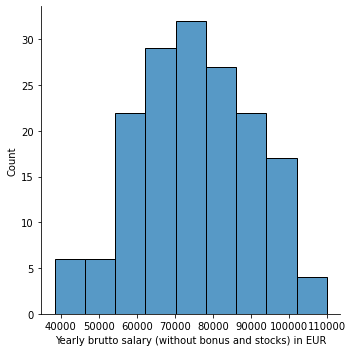

In [24]:
a = df40[(df40['Years of experience in Germany'] == 'greater than 5 years')]
sns.displot(data = a , x= 'Yearly brutto salary (without bonus and stocks) in EUR', kind='hist' );

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, 'less than 5 years'),
  Text(1, 0, 'greater than 5 years'),
  Text(2, 0, '0'),
  Text(3, 0, '15'),
  Text(4, 0, '2.5'),
  Text(5, 0, '1,5'),
  Text(6, 0, '1.5'),
  Text(7, 0, '0.5'),
  Text(8, 0, '3.5'),
  Text(9, 0, '0,5')])

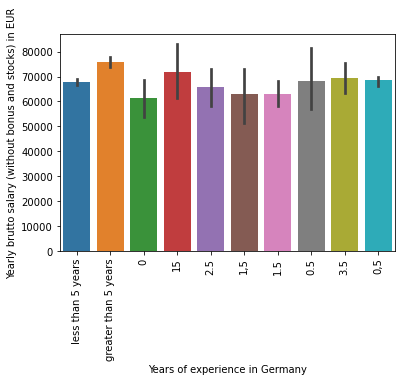

In [25]:
sns.barplot(x="Years of experience in Germany", y = "Yearly brutto salary (without bonus and stocks) in EUR", data=df40);
plt.xticks(rotation=90)

### The Diagram view that the employees with less than 5 years exp. in germany have more salary.
### Then the most employess out of germany have greater salary than the employes  that have exp. in germany

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, 'greater than 5 years'),
  Text(1, 0, '15'),
  Text(2, 0, '3.5'),
  Text(3, 0, '0,5'),
  Text(4, 0, '0.5'),
  Text(5, 0, 'less than 5 years'),
  Text(6, 0, '2.5'),
  Text(7, 0, '1.5'),
  Text(8, 0, '1,5'),
  Text(9, 0, '0')])

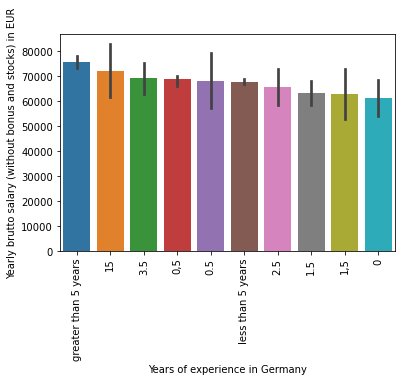

In [26]:
sns.barplot(data = df40 , x = 'Years of experience in Germany' , y = 'Yearly brutto salary (without bonus and stocks) in EUR',order=df40.groupby('Years of experience in Germany')['Yearly brutto salary (without bonus and stocks) in EUR'].mean().sort_values(ascending=False).index) 
plt.xticks(rotation=90)

<AxesSubplot:xlabel='Seniority level', ylabel='Years of experience in Germany'>

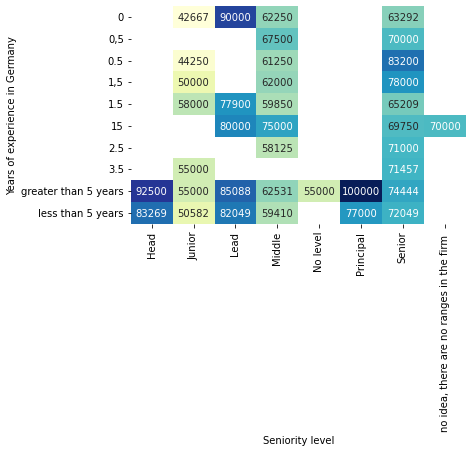

In [27]:
heatmap_data = pd.pivot_table(df40, values='Yearly brutto salary (without bonus and stocks) in EUR', index='Years of experience in Germany', columns='Seniority level')
sns.heatmap(heatmap_data, cmap='YlGnBu', annot=True, fmt='.0f', cbar=False)

### The diagram identify that the middle level (seniority level) less than 5 years EXP. in germany has more salary and the diagrame identify also that the senior employee that have less than 5 year exp. less salary than that have greater than 5 years exp.
### Diagram shows also that has less than 5 years exp.in germany overall has more salary This means that they are from other countries(expatriates) so they take more salary   

# ---------------------------------------------------------------------------------------------------------------



# Are male employees generating more income than female employees?


In [28]:
df30 = df.drop(['Years of experience in Germany', 'Your main technology / programming language'],axis=1).copy()
df30

,Timestamp,Age,Gender,City,Position,Total years of experience,Seniority level,Other technologies/programming languages you use often,Yearly brutto salary (without bonus and stocks) in EUR,Yearly bonus + stocks in EUR,Annual brutto salary (without bonus and stocks) one year ago. Only answer if staying in the same country,Annual bonus+stocks one year ago. Only answer if staying in same country,Number of vacation days,Employment status,Сontract duration,Main language at work,Company size,Company type,Have you lost your job due to the coronavirus outbreak?
0,24/11/2020 11:14:15,26.0,Male,Munich,Software Engineer,5,Senior,"Kotlin, Javascript / Typescript",80000.0,5000,75000.0,10000,30,Full-time employee,Unlimited contract,English,51-100,Product,No
1,24/11/2020 11:14:16,26.0,Male,Berlin,Backend Developer,7,Senior,NaN,80000.0,0,82000.0,5000,28,Full-time employee,Unlimited contract,English,101-1000,Product,No
3,24/11/2020 11:15:24,28.0,Male,Berlin,Frontend Developer,4,Junior,NaN,54000.0,0,NaN,NaN,24,Full-time employee,Unlimited contract,English,51-100,Startup,No
4,24/11/2020 11:15:46,37.0,Male,Berlin,Backend Developer,17,Senior,".NET, SQL, AWS, Docker",62000.0,0,62000.0,NaN,29,Full-time employee,Unlimited contract,English,101-1000,Product,No
5,24/11/2020 11:15:53,32.0,Male,Berlin,DevOps,5,Senior,"Python, AWS, Google Cloud, Kubernetes, Docker",76000.0,5000,76000.0,5000,30,Full-time employee,Unlimited contract,English,Nov-50,Startup,No
6,24/11/2020 11:16:35,37.0,Male,Berlin,Frontend Developer,6,Middle,NaN,57000.0,0,NaN,NaN,24,Full-time employee,Unlimited contract,English,Nov-50,Product,No
7,24/11/2020 11:16:44,24.0,Male,Berlin,Frontend Developer,5,Senior,Javascript / Typescript,65000.0,0,65000.0,NaN,27,Full-time employee,Unlimited contract,English,1000+,Product,No
8,24/11/2020 11:17:24,29.0,Male,Berlin,Backend Developer,8,Senior,"SQL, AWS, Docker",56000.0,0,55000.0,NaN,28,Full-time employee,Unlimited contract,English,101-1000,Product,No
9,24/11/2020 11:17:50,35.0,Male,Berlin,Software Engineer,15,Lead,NaN,95000.0,0,90000.0,NaN,30,Full-time employee,Unlimited contract,English,101-1000,Product,No
10,24/11/2020 11:18:06,32.0,Female,Hamburg,Data Engineer,2,Junior,"Python, Kotlin, Javascript / Typescript, SQL, AWS",52500.0,0,52500.0,NaN,30,Full-time employee,Unlimited contract,German,101-1000,Consulting / Agency,No


In [29]:
df30=df30.drop(['Annual bonus+stocks one year ago. Only answer if staying in same country','Number of vacation days'],axis=1)
df30

,Timestamp,Age,Gender,City,Position,Total years of experience,Seniority level,Other technologies/programming languages you use often,Yearly brutto salary (without bonus and stocks) in EUR,Yearly bonus + stocks in EUR,Annual brutto salary (without bonus and stocks) one year ago. Only answer if staying in the same country,Employment status,Сontract duration,Main language at work,Company size,Company type,Have you lost your job due to the coronavirus outbreak?
0,24/11/2020 11:14:15,26.0,Male,Munich,Software Engineer,5,Senior,"Kotlin, Javascript / Typescript",80000.0,5000,75000.0,Full-time employee,Unlimited contract,English,51-100,Product,No
1,24/11/2020 11:14:16,26.0,Male,Berlin,Backend Developer,7,Senior,NaN,80000.0,0,82000.0,Full-time employee,Unlimited contract,English,101-1000,Product,No
3,24/11/2020 11:15:24,28.0,Male,Berlin,Frontend Developer,4,Junior,NaN,54000.0,0,NaN,Full-time employee,Unlimited contract,English,51-100,Startup,No
4,24/11/2020 11:15:46,37.0,Male,Berlin,Backend Developer,17,Senior,".NET, SQL, AWS, Docker",62000.0,0,62000.0,Full-time employee,Unlimited contract,English,101-1000,Product,No
5,24/11/2020 11:15:53,32.0,Male,Berlin,DevOps,5,Senior,"Python, AWS, Google Cloud, Kubernetes, Docker",76000.0,5000,76000.0,Full-time employee,Unlimited contract,English,Nov-50,Startup,No
6,24/11/2020 11:16:35,37.0,Male,Berlin,Frontend Developer,6,Middle,NaN,57000.0,0,NaN,Full-time employee,Unlimited contract,English,Nov-50,Product,No
7,24/11/2020 11:16:44,24.0,Male,Berlin,Frontend Developer,5,Senior,Javascript / Typescript,65000.0,0,65000.0,Full-time employee,Unlimited contract,English,1000+,Product,No
8,24/11/2020 11:17:24,29.0,Male,Berlin,Backend Developer,8,Senior,"SQL, AWS, Docker",56000.0,0,55000.0,Full-time employee,Unlimited contract,English,101-1000,Product,No
9,24/11/2020 11:17:50,35.0,Male,Berlin,Software Engineer,15,Lead,NaN,95000.0,0,90000.0,Full-time employee,Unlimited contract,English,101-1000,Product,No
10,24/11/2020 11:18:06,32.0,Female,Hamburg,Data Engineer,2,Junior,"Python, Kotlin, Javascript / Typescript, SQL, AWS",52500.0,0,52500.0,Full-time employee,Unlimited contract,German,101-1000,Consulting / Agency,No


In [30]:
df30=df30.drop(['Other technologies/programming languages you use often','Annual brutto salary (without bonus and stocks) one year ago. Only answer if staying in the same country'],axis=1)
df30

,Timestamp,Age,Gender,City,Position,Total years of experience,Seniority level,Yearly brutto salary (without bonus and stocks) in EUR,Yearly bonus + stocks in EUR,Employment status,Сontract duration,Main language at work,Company size,Company type,Have you lost your job due to the coronavirus outbreak?
0,24/11/2020 11:14:15,26.0,Male,Munich,Software Engineer,5,Senior,80000.0,5000,Full-time employee,Unlimited contract,English,51-100,Product,No
1,24/11/2020 11:14:16,26.0,Male,Berlin,Backend Developer,7,Senior,80000.0,0,Full-time employee,Unlimited contract,English,101-1000,Product,No
3,24/11/2020 11:15:24,28.0,Male,Berlin,Frontend Developer,4,Junior,54000.0,0,Full-time employee,Unlimited contract,English,51-100,Startup,No
4,24/11/2020 11:15:46,37.0,Male,Berlin,Backend Developer,17,Senior,62000.0,0,Full-time employee,Unlimited contract,English,101-1000,Product,No
5,24/11/2020 11:15:53,32.0,Male,Berlin,DevOps,5,Senior,76000.0,5000,Full-time employee,Unlimited contract,English,Nov-50,Startup,No
6,24/11/2020 11:16:35,37.0,Male,Berlin,Frontend Developer,6,Middle,57000.0,0,Full-time employee,Unlimited contract,English,Nov-50,Product,No
7,24/11/2020 11:16:44,24.0,Male,Berlin,Frontend Developer,5,Senior,65000.0,0,Full-time employee,Unlimited contract,English,1000+,Product,No
8,24/11/2020 11:17:24,29.0,Male,Berlin,Backend Developer,8,Senior,56000.0,0,Full-time employee,Unlimited contract,English,101-1000,Product,No
9,24/11/2020 11:17:50,35.0,Male,Berlin,Software Engineer,15,Lead,95000.0,0,Full-time employee,Unlimited contract,English,101-1000,Product,No
10,24/11/2020 11:18:06,32.0,Female,Hamburg,Data Engineer,2,Junior,52500.0,0,Full-time employee,Unlimited contract,German,101-1000,Consulting / Agency,No


<AxesSubplot:>

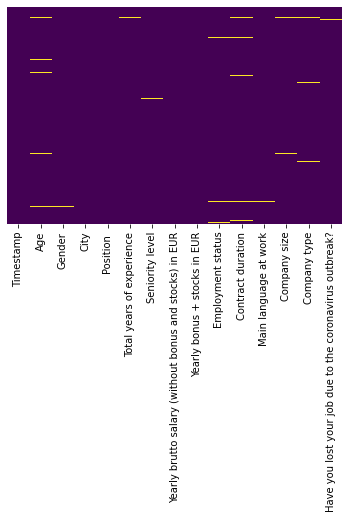

In [31]:
sns.heatmap(df30.isnull(), yticklabels = False, cbar = False, cmap = 'viridis')

In [32]:
df31 = df30.dropna(axis=0, how='any')
df31

,Timestamp,Age,Gender,City,Position,Total years of experience,Seniority level,Yearly brutto salary (without bonus and stocks) in EUR,Yearly bonus + stocks in EUR,Employment status,Сontract duration,Main language at work,Company size,Company type,Have you lost your job due to the coronavirus outbreak?
0,24/11/2020 11:14:15,26.0,Male,Munich,Software Engineer,5,Senior,80000.0,5000,Full-time employee,Unlimited contract,English,51-100,Product,No
1,24/11/2020 11:14:16,26.0,Male,Berlin,Backend Developer,7,Senior,80000.0,0,Full-time employee,Unlimited contract,English,101-1000,Product,No
3,24/11/2020 11:15:24,28.0,Male,Berlin,Frontend Developer,4,Junior,54000.0,0,Full-time employee,Unlimited contract,English,51-100,Startup,No
4,24/11/2020 11:15:46,37.0,Male,Berlin,Backend Developer,17,Senior,62000.0,0,Full-time employee,Unlimited contract,English,101-1000,Product,No
5,24/11/2020 11:15:53,32.0,Male,Berlin,DevOps,5,Senior,76000.0,5000,Full-time employee,Unlimited contract,English,Nov-50,Startup,No
6,24/11/2020 11:16:35,37.0,Male,Berlin,Frontend Developer,6,Middle,57000.0,0,Full-time employee,Unlimited contract,English,Nov-50,Product,No
7,24/11/2020 11:16:44,24.0,Male,Berlin,Frontend Developer,5,Senior,65000.0,0,Full-time employee,Unlimited contract,English,1000+,Product,No
8,24/11/2020 11:17:24,29.0,Male,Berlin,Backend Developer,8,Senior,56000.0,0,Full-time employee,Unlimited contract,English,101-1000,Product,No
9,24/11/2020 11:17:50,35.0,Male,Berlin,Software Engineer,15,Lead,95000.0,0,Full-time employee,Unlimited contract,English,101-1000,Product,No
10,24/11/2020 11:18:06,32.0,Female,Hamburg,Data Engineer,2,Junior,52500.0,0,Full-time employee,Unlimited contract,German,101-1000,Consulting / Agency,No


In [33]:
df31.index

Int64Index([   0,    1,    3,    4,    5,    6,    7,    8,    9,   10,
            ...
            1236, 1237, 1238, 1239, 1244, 1245, 1247, 1248, 1251, 1252],
           dtype='int64', length=978)

In [34]:
df32=df31.loc[df31['Gender'] == 'Female']
df32
# To know number of women after cleaning

,Timestamp,Age,Gender,City,Position,Total years of experience,Seniority level,Yearly brutto salary (without bonus and stocks) in EUR,Yearly bonus + stocks in EUR,Employment status,Сontract duration,Main language at work,Company size,Company type,Have you lost your job due to the coronavirus outbreak?
10,24/11/2020 11:18:06,32.0,Female,Hamburg,Data Engineer,2,Junior,52500.0,0,Full-time employee,Unlimited contract,German,101-1000,Consulting / Agency,No
32,24/11/2020 11:27:39,29.0,Female,Berlin,QA Engineer,7,Middle,45000.0,2000,Full-time employee,Unlimited contract,English,51-100,Startup,No
36,24/11/2020 11:28:58,28.0,Female,Berlin,Designer (UI/UX),7,Middle,45000.0,0,Full-time employee,Unlimited contract,German,1000+,Product,No
46,24/11/2020 11:31:38,28.0,Female,Berlin,Designer (UI/UX),5,Senior,60000.0,0,Full-time employee,Unlimited contract,English,1000+,Product,No
48,24/11/2020 11:31:50,38.0,Female,Berlin,Backend Developer,12,Senior,70000.0,8000,Full-time employee,Unlimited contract,English,1000+,Product,No
51,24/11/2020 11:32:24,28.0,Female,Berlin,Designer (UI/UX),7,Middle,45000.0,0,Full-time employee,Unlimited contract,German,1000+,Product,No
52,24/11/2020 11:32:28,29.0,Female,Berlin,QA Engineer,8,Senior,60000.0,0,Full-time employee,Unlimited contract,English,51-100,Startup,Yes
60,24/11/2020 11:35:25,39.0,Female,Berlin,Software Engineer,10,Senior,70500.0,1000,Full-time employee,Unlimited contract,German,101-1000,Consulting / Agency,No
79,24/11/2020 11:44:02,26.0,Female,Munich,Data Scientist,6,Middle,60000.0,10000,Full-time employee,Unlimited contract,English,1000+,Product,No
87,24/11/2020 11:46:15,32.0,Female,Berlin,QA Engineer,10,Senior,61000.0,0,Full-time employee,Unlimited contract,English,101-1000,Product,No


In [35]:
dffemale=df32.loc[df32['Position '] == 'Software Engineer']
dffemale
# To know number of women working as SE 

,Timestamp,Age,Gender,City,Position,Total years of experience,Seniority level,Yearly brutto salary (without bonus and stocks) in EUR,Yearly bonus + stocks in EUR,Employment status,Сontract duration,Main language at work,Company size,Company type,Have you lost your job due to the coronavirus outbreak?
60,24/11/2020 11:35:25,39.0,Female,Berlin,Software Engineer,10,Senior,70500.0,1000,Full-time employee,Unlimited contract,German,101-1000,Consulting / Agency,No
117,24/11/2020 11:57:53,30.0,Female,Berlin,Software Engineer,8,Senior,75000.0,0,Full-time employee,Unlimited contract,English,101-1000,Product,No
153,24/11/2020 12:14:23,40.0,Female,Munich,Software Engineer,20,Middle,54000.0,0,Full-time employee,Unlimited contract,German,101-1000,Behörde,No
198,24/11/2020 12:55:58,35.0,Female,Berlin,Software Engineer,15,Senior,76000.0,0,Full-time employee,Unlimited contract,German,1000+,Product,No
231,24/11/2020 13:51:23,24.0,Female,Stuttgart,Software Engineer,2,Middle,55200.0,2000,Full-time employee,Unlimited contract,English,Nov-50,Consulting / Agency,No
239,24/11/2020 14:00:19,26.0,Female,Berlin,Software Engineer,6,Senior,65000.0,1000,Full-time employee,Unlimited contract,English,101-1000,Product,No
310,24/11/2020 16:16:41,34.0,Female,Berlin,Software Engineer,9,Senior,78000.0,3000,Full-time employee,Unlimited contract,English,101-1000,Product,No
313,24/11/2020 16:34:40,29.0,Female,Munich,Software Engineer,5,Middle,67000.0,5000,Full-time employee,Unlimited contract,English,101-1000,Product,No
356,24/11/2020 18:10:47,28.0,Female,Berlin,Software Engineer,8,Lead,80000.0,0,Full-time employee,Unlimited contract,English,101-1000,Product,No
373,24/11/2020 18:44:33,28.0,Female,Mannheim,Software Engineer,4,Junior,53000.0,0,Full-time employee,Unlimited contract,English,1000+,Consulting / Agency,No


In [36]:
df33=df31.loc[df31['Gender'] == 'Male']
df33
# To know number of men after cleaning

,Timestamp,Age,Gender,City,Position,Total years of experience,Seniority level,Yearly brutto salary (without bonus and stocks) in EUR,Yearly bonus + stocks in EUR,Employment status,Сontract duration,Main language at work,Company size,Company type,Have you lost your job due to the coronavirus outbreak?
0,24/11/2020 11:14:15,26.0,Male,Munich,Software Engineer,5,Senior,80000.0,5000,Full-time employee,Unlimited contract,English,51-100,Product,No
1,24/11/2020 11:14:16,26.0,Male,Berlin,Backend Developer,7,Senior,80000.0,0,Full-time employee,Unlimited contract,English,101-1000,Product,No
3,24/11/2020 11:15:24,28.0,Male,Berlin,Frontend Developer,4,Junior,54000.0,0,Full-time employee,Unlimited contract,English,51-100,Startup,No
4,24/11/2020 11:15:46,37.0,Male,Berlin,Backend Developer,17,Senior,62000.0,0,Full-time employee,Unlimited contract,English,101-1000,Product,No
5,24/11/2020 11:15:53,32.0,Male,Berlin,DevOps,5,Senior,76000.0,5000,Full-time employee,Unlimited contract,English,Nov-50,Startup,No
6,24/11/2020 11:16:35,37.0,Male,Berlin,Frontend Developer,6,Middle,57000.0,0,Full-time employee,Unlimited contract,English,Nov-50,Product,No
7,24/11/2020 11:16:44,24.0,Male,Berlin,Frontend Developer,5,Senior,65000.0,0,Full-time employee,Unlimited contract,English,1000+,Product,No
8,24/11/2020 11:17:24,29.0,Male,Berlin,Backend Developer,8,Senior,56000.0,0,Full-time employee,Unlimited contract,English,101-1000,Product,No
9,24/11/2020 11:17:50,35.0,Male,Berlin,Software Engineer,15,Lead,95000.0,0,Full-time employee,Unlimited contract,English,101-1000,Product,No
13,24/11/2020 11:18:26,34.0,Male,Berlin,Software Engineer,14,Senior,70000.0,0,Full-time employee,Unlimited contract,English,Nov-50,Startup,No


In [37]:
dfmale=df33.loc[df33['Position '] == 'Software Engineer']
dfmale
# To know number of men working as SE 

,Timestamp,Age,Gender,City,Position,Total years of experience,Seniority level,Yearly brutto salary (without bonus and stocks) in EUR,Yearly bonus + stocks in EUR,Employment status,Сontract duration,Main language at work,Company size,Company type,Have you lost your job due to the coronavirus outbreak?
0,24/11/2020 11:14:15,26.0,Male,Munich,Software Engineer,5,Senior,80000.0,5000,Full-time employee,Unlimited contract,English,51-100,Product,No
9,24/11/2020 11:17:50,35.0,Male,Berlin,Software Engineer,15,Lead,95000.0,0,Full-time employee,Unlimited contract,English,101-1000,Product,No
13,24/11/2020 11:18:26,34.0,Male,Berlin,Software Engineer,14,Senior,70000.0,0,Full-time employee,Unlimited contract,English,Nov-50,Startup,No
22,24/11/2020 11:22:57,25.0,Male,Berlin,Software Engineer,5,Senior,65000.0,0,Full-time employee,Unlimited contract,German,1000+,Product,No
24,24/11/2020 11:23:53,36.0,Male,Berlin,Software Engineer,17,Lead,70000.0,0,Full-time employee,Unlimited contract,English,101-1000,Product,No
30,24/11/2020 11:26:59,29.0,Male,Berlin,Software Engineer,6,Lead,85000.0,5000,Full-time employee,Unlimited contract,English,101-1000,Product,No
33,24/11/2020 11:27:49,39.0,Male,Berlin,Software Engineer,8,Senior,80000.0,0,Full-time employee,Unlimited contract,English,51-100,Startup,No
34,24/11/2020 11:28:12,27.0,Male,Berlin,Software Engineer,8,Middle,63000.0,101,Full-time employee,Unlimited contract,English,101-1000,Product,No
37,24/11/2020 11:29:18,30.0,Male,Berlin,Software Engineer,8,Senior,80000.0,0,Full-time employee,Unlimited contract,English,101-1000,Product,No
41,24/11/2020 11:30:11,49.0,Male,Berlin,Software Engineer,15,Senior,67000.0,1500,Full-time employee,Unlimited contract,German,1000+,Product,No


In [38]:
dfmale=dfmale.loc[dfmale['Seniority level'] == 'Middle']
dfmale
# number of men / working as SE / middle 

,Timestamp,Age,Gender,City,Position,Total years of experience,Seniority level,Yearly brutto salary (without bonus and stocks) in EUR,Yearly bonus + stocks in EUR,Employment status,Сontract duration,Main language at work,Company size,Company type,Have you lost your job due to the coronavirus outbreak?
34,24/11/2020 11:28:12,27.0,Male,Berlin,Software Engineer,8,Middle,63000.0,101,Full-time employee,Unlimited contract,English,101-1000,Product,No
69,24/11/2020 11:40:04,28.0,Male,Berlin,Software Engineer,3,Middle,55000.0,0,Full-time employee,Unlimited contract,English,Nov-50,Startup,No
77,24/11/2020 11:43:49,33.0,Male,Frankfurt,Software Engineer,4,Middle,50000.0,0,Full-time employee,Unlimited contract,English,Nov-50,Consulting / Agency,No
85,24/11/2020 11:45:28,33.0,Male,Berlin,Software Engineer,5,Middle,65000.0,0,Full-time employee,Unlimited contract,English,101-1000,Product,No
104,24/11/2020 11:54:06,25.0,Male,Munich,Software Engineer,3,Middle,62000.0,0,Full-time employee,Unlimited contract,English,101-1000,Product,No
115,24/11/2020 11:56:56,24.0,Male,Munich,Software Engineer,5,Middle,79000.0,56000,Full-time employee,Unlimited contract,English,1000+,Product,No
172,24/11/2020 12:27:21,29.0,Male,Berlin,Software Engineer,8,Middle,55000.0,0,Full-time employee,Unlimited contract,English,Nov-50,Startup,No
194,24/11/2020 12:52:56,36.0,Male,Berlin,Software Engineer,7,Middle,42000.0,0,Full-time employee,Unlimited contract,English and German,up to 10,Product,No
201,24/11/2020 13:00:56,30.0,Male,Rosenheim,Software Engineer,9,Middle,63000.0,0,Full-time employee,Unlimited contract,German,101-1000,Product,No
206,24/11/2020 13:05:53,25.0,Male,Berlin,Software Engineer,6,Middle,61500.0,26000,Full-time employee,Unlimited contract,English,1000+,Big commercial,No


In [39]:
dffemale=dffemale.loc[dffemale['Seniority level'] == 'Middle']
dffemale
# number of women / working as SE / middle 

,Timestamp,Age,Gender,City,Position,Total years of experience,Seniority level,Yearly brutto salary (without bonus and stocks) in EUR,Yearly bonus + stocks in EUR,Employment status,Сontract duration,Main language at work,Company size,Company type,Have you lost your job due to the coronavirus outbreak?
153,24/11/2020 12:14:23,40.0,Female,Munich,Software Engineer,20,Middle,54000.0,0,Full-time employee,Unlimited contract,German,101-1000,Behörde,No
231,24/11/2020 13:51:23,24.0,Female,Stuttgart,Software Engineer,2,Middle,55200.0,2000,Full-time employee,Unlimited contract,English,Nov-50,Consulting / Agency,No
313,24/11/2020 16:34:40,29.0,Female,Munich,Software Engineer,5,Middle,67000.0,5000,Full-time employee,Unlimited contract,English,101-1000,Product,No
419,24/11/2020 20:26:58,28.0,Female,Berlin,Software Engineer,3,Middle,60000.0,0,Full-time employee,Unlimited contract,English,101-1000,Startup,No
420,24/11/2020 20:28:38,31.0,Female,Munich,Software Engineer,2,Middle,58000.0,3000,Full-time employee,Unlimited contract,German,1000+,Product,No
461,24/11/2020 23:20:02,33.0,Female,Berlin,Software Engineer,6,Middle,65000.0,0,Full-time employee,Unlimited contract,English,1000+,Startup,No
514,25/11/2020 10:02:55,24.0,Female,Berlin,Software Engineer,2,Middle,58000.0,0,Full-time employee,Unlimited contract,German,Nov-50,Consulting / Agency,No
589,25/11/2020 13:54:19,30.0,Female,Berlin,Software Engineer,4,Middle,56000.0,0,Full-time employee,Unlimited contract,English,1000+,Product,No
631,25/11/2020 16:06:56,25.0,Female,Frankfurt,Software Engineer,3,Middle,53000.0,5000,Full-time employee,Unlimited contract,German,1000+,Product,No
755,26/11/2020 10:40:41,24.0,Female,Prague,Software Engineer,3,Middle,29000.0,0,Full-time employee,Unlimited contract,English,Nov-50,Startup,No


In [40]:
dffemale2=df32.loc[df32['Position '] == 'Data Scientist']
dffemale2
# To know number of women working as DS

,Timestamp,Age,Gender,City,Position,Total years of experience,Seniority level,Yearly brutto salary (without bonus and stocks) in EUR,Yearly bonus + stocks in EUR,Employment status,Сontract duration,Main language at work,Company size,Company type,Have you lost your job due to the coronavirus outbreak?
79,24/11/2020 11:44:02,26.0,Female,Munich,Data Scientist,6,Middle,60000.0,10000,Full-time employee,Unlimited contract,English,1000+,Product,No
123,24/11/2020 11:59:38,26.0,Female,Munich,Data Scientist,3,Junior,70000.0,12000,Full-time employee,Unlimited contract,English,1000+,Product,No
240,24/11/2020 14:01:01,31.0,Female,Stuttgart,Data Scientist,4,Middle,65000.0,73000,Full-time employee,Unlimited contract,German,1000+,Product,No
398,24/11/2020 19:31:46,32.0,Female,Cologne,Data Scientist,4,Senior,85000.0,88000,Full-time employee,Unlimited contract,English,1000+,consumer goods,No
402,24/11/2020 19:47:34,27.0,Female,Berlin,Data Scientist,3,Middle,58000.0,1000,Full-time employee,Unlimited contract,English,51-100,Product,No
500,25/11/2020 09:06:43,26.0,Female,Berlin,Data Scientist,2,Junior,47000.0,0,Full-time employee,Unlimited contract,English,Nov-50,Consulting / Agency,No
563,25/11/2020 12:23:50,30.0,Female,Berlin,Data Scientist,6,Senior,76000.0,10000,Full-time employee,Unlimited contract,English,1000+,Product,No
571,25/11/2020 13:03:32,37.0,Female,Berlin,Data Scientist,2,Middle,62000.0,0,Full-time employee,Unlimited contract,German,101-1000,Publisher,No
579,25/11/2020 13:39:11,26.0,Female,Berlin,Data Scientist,4,Middle,45000.0,0,Full-time employee,Temporary contract,English,101-1000,Startup,Yes
605,25/11/2020 14:21:26,28.0,Female,Berlin,Data Scientist,6,Senior,70000.0,0,Full-time employee,Unlimited contract,English,1000+,Product,No


In [41]:
dffemale2=dffemale2.loc[dffemale2['Seniority level'] == 'Senior']
dffemale2
# number of women / DS / Senior


,Timestamp,Age,Gender,City,Position,Total years of experience,Seniority level,Yearly brutto salary (without bonus and stocks) in EUR,Yearly bonus + stocks in EUR,Employment status,Сontract duration,Main language at work,Company size,Company type,Have you lost your job due to the coronavirus outbreak?
398,24/11/2020 19:31:46,32.0,Female,Cologne,Data Scientist,4,Senior,85000.0,88000,Full-time employee,Unlimited contract,English,1000+,consumer goods,No
563,25/11/2020 12:23:50,30.0,Female,Berlin,Data Scientist,6,Senior,76000.0,10000,Full-time employee,Unlimited contract,English,1000+,Product,No
605,25/11/2020 14:21:26,28.0,Female,Berlin,Data Scientist,6,Senior,70000.0,0,Full-time employee,Unlimited contract,English,1000+,Product,No
639,25/11/2020 16:42:43,36.0,Female,Berlin,Data Scientist,5,Senior,75000.0,0,Part-time employee,Unlimited contract,English,51-100,Startup,No
816,27/11/2020 08:08:17,33.0,Female,Berlin,Data Scientist,8,Senior,77000.0,0,Full-time employee,Unlimited contract,English,1000+,Product,No
909,29/11/2020 17:12:02,30.0,Female,Cologne,Data Scientist,8,Senior,85000.0,7000,Full-time employee,Unlimited contract,both,1000+,Utilities,No
992,30/11/2020 21:19:16,35.0,Female,Munich,Data Scientist,5,Senior,75000.0,10000,Full-time employee,Unlimited contract,English,1000+,Bank,No
1004,1/12/2020 0:06,32.0,Female,Munich,Data Scientist,5,Senior,80000.0,0,Full-time employee,Unlimited contract,German,1000+,Product,No
1064,2/12/2020 21:42,36.0,Female,Berlin,Data Scientist,5,Senior,87000.0,15000,Full-time employee,Unlimited contract,English,1000+,Product,No


In [42]:
dfmale2=df33.loc[df33['Position '] == 'Data Scientist']
dfmale2
# To know number of men working as DS

,Timestamp,Age,Gender,City,Position,Total years of experience,Seniority level,Yearly brutto salary (without bonus and stocks) in EUR,Yearly bonus + stocks in EUR,Employment status,Сontract duration,Main language at work,Company size,Company type,Have you lost your job due to the coronavirus outbreak?
66,24/11/2020 11:38:15,32.0,Male,Berlin,Data Scientist,10,Head,110000.0,30000,Full-time employee,Unlimited contract,English,1000+,Consulting / Agency,No
88,24/11/2020 11:46:16,24.0,Male,Berlin,Data Scientist,4,Senior,73000.0,73000,Full-time employee,Unlimited contract,English,101-1000,Startup,No
90,24/11/2020 11:46:42,29.0,Male,Berlin,Data Scientist,4,Senior,81000.0,0,Full-time employee,Unlimited contract,English,101-1000,Product,No
109,24/11/2020 11:55:33,26.0,Male,Munich,Data Scientist,3,Middle,65000.0,7000,Full-time employee,Unlimited contract,English,101-1000,Product,No
145,24/11/2020 12:09:55,26.0,Male,Münster,Data Scientist,5.5,Junior,48000.0,2000,Full-time employee,Unlimited contract,German,1000+,Product,No
160,24/11/2020 12:17:21,34.0,Male,Vienna,Data Scientist,12,Senior,77500.0,7750,Full-time employee,Unlimited contract,English,101-1000,Consulting / Agency,No
215,24/11/2020 13:21:22,34.0,Male,Berlin,Data Scientist,5,Middle,65000.0,5000,Full-time employee,Unlimited contract,English,101-1000,Product,No
341,24/11/2020 17:40:40,25.0,Male,Hamburg,Data Scientist,2,Middle,48000.0,5000,Full-time employee,Unlimited contract,German,Nov-50,Product,No
447,24/11/2020 21:47:33,30.0,Male,Utrecht,Data Scientist,2,Middle,48000.0,10000,Full-time employee,Temporary contract,English,1000+,Product,No
497,25/11/2020 09:05:26,38.0,Male,Berlin,Data Scientist,15,Head,100000.0,120000,Full-time employee,Unlimited contract,English,101-1000,Startup,No


In [43]:
dfmale2=dfmale2.loc[dfmale2['Seniority level'] == 'Senior']
dfmale2
# number of men / DS / Senior

,Timestamp,Age,Gender,City,Position,Total years of experience,Seniority level,Yearly brutto salary (without bonus and stocks) in EUR,Yearly bonus + stocks in EUR,Employment status,Сontract duration,Main language at work,Company size,Company type,Have you lost your job due to the coronavirus outbreak?
88,24/11/2020 11:46:16,24.0,Male,Berlin,Data Scientist,4,Senior,73000.0,73000,Full-time employee,Unlimited contract,English,101-1000,Startup,No
90,24/11/2020 11:46:42,29.0,Male,Berlin,Data Scientist,4,Senior,81000.0,0,Full-time employee,Unlimited contract,English,101-1000,Product,No
160,24/11/2020 12:17:21,34.0,Male,Vienna,Data Scientist,12,Senior,77500.0,7750,Full-time employee,Unlimited contract,English,101-1000,Consulting / Agency,No
518,25/11/2020 10:33:07,39.0,Male,Berlin,Data Scientist,7,Senior,70000.0,70000,Full-time employee,Unlimited contract,English,101-1000,Startup,No
575,25/11/2020 13:20:02,31.0,Male,Berlin,Data Scientist,6,Senior,78000.0,0,Full-time employee,Unlimited contract,English,1000+,E-commerce,No
593,25/11/2020 13:58:38,30.0,Male,Berlin,Data Scientist,6,Senior,72000.0,85000,Full-time employee,Unlimited contract,English,1000+,Startup,No
597,25/11/2020 14:00:28,38.0,Male,Berlin,Data Scientist,15,Senior,56000.0,59000,Full-time employee,Unlimited contract,English,Nov-50,Product,No
598,25/11/2020 14:02:47,39.0,Male,Hamburg,Data Scientist,10,Senior,80000.0,0,Full-time employee,Unlimited contract,English,1000+,Energy,No
644,25/11/2020 17:08:54,31.0,Male,Frankfurt,Data Scientist,6,Senior,60000.0,15000,Full-time employee,Unlimited contract,English,51-100,Consulting / Agency,No
775,26/11/2020 15:31:02,34.0,Male,Berlin,Data Scientist,6,Senior,80000.0,10000,Full-time employee,Unlimited contract,English,1000+,Product,No


In [44]:
dfmale2['Yearly brutto salary (without bonus and stocks) in EUR'].mean()

74045.65217391304

In [45]:
dffemale2['Yearly brutto salary (without bonus and stocks) in EUR'].mean()

78888.88888888889

In [46]:
dffemale['Yearly brutto salary (without bonus and stocks) in EUR'].mean()

57305.882352941175

In [47]:
dfmale['Yearly brutto salary (without bonus and stocks) in EUR'].mean()

63967.09859154929

### Get the avg salary for females and males to to check the final answer 

### Now i will analyze (SE / Middle) and (DS / Senior) to get answer because they  are the most 

In [48]:
dfsoft=df30.loc[df30['Position '] == 'Software Engineer']
dfsoft
# Get all SE employee

,Timestamp,Age,Gender,City,Position,Total years of experience,Seniority level,Yearly brutto salary (without bonus and stocks) in EUR,Yearly bonus + stocks in EUR,Employment status,Сontract duration,Main language at work,Company size,Company type,Have you lost your job due to the coronavirus outbreak?
0,24/11/2020 11:14:15,26.0,Male,Munich,Software Engineer,5,Senior,80000.0,5000,Full-time employee,Unlimited contract,English,51-100,Product,No
9,24/11/2020 11:17:50,35.0,Male,Berlin,Software Engineer,15,Lead,95000.0,0,Full-time employee,Unlimited contract,English,101-1000,Product,No
11,24/11/2020 11:18:16,NaN,Male,Berlin,Software Engineer,25,Senior,100000.0,101,Self-employed (freelancer),Temporary contract,English,Nov-50,Product,Yes
12,24/11/2020 11:18:22,NaN,NaN,Berlin,Software Engineer,NaN,Lead,90000.0,40000,Full-time employee,Unlimited contract,English,1000+,NaN,No
13,24/11/2020 11:18:26,34.0,Male,Berlin,Software Engineer,14,Senior,70000.0,0,Full-time employee,Unlimited contract,English,Nov-50,Startup,No
22,24/11/2020 11:22:57,25.0,Male,Berlin,Software Engineer,5,Senior,65000.0,0,Full-time employee,Unlimited contract,German,1000+,Product,No
24,24/11/2020 11:23:53,36.0,Male,Berlin,Software Engineer,17,Lead,70000.0,0,Full-time employee,Unlimited contract,English,101-1000,Product,No
30,24/11/2020 11:26:59,29.0,Male,Berlin,Software Engineer,6,Lead,85000.0,5000,Full-time employee,Unlimited contract,English,101-1000,Product,No
33,24/11/2020 11:27:49,39.0,Male,Berlin,Software Engineer,8,Senior,80000.0,0,Full-time employee,Unlimited contract,English,51-100,Startup,No
34,24/11/2020 11:28:12,27.0,Male,Berlin,Software Engineer,8,Middle,63000.0,101,Full-time employee,Unlimited contract,English,101-1000,Product,No


In [49]:
dfsoft1=dfsoft.loc[dfsoft['Seniority level'] == 'Middle']
dfsoft1
# Get all SE seniors employee

,Timestamp,Age,Gender,City,Position,Total years of experience,Seniority level,Yearly brutto salary (without bonus and stocks) in EUR,Yearly bonus + stocks in EUR,Employment status,Сontract duration,Main language at work,Company size,Company type,Have you lost your job due to the coronavirus outbreak?
34,24/11/2020 11:28:12,27.0,Male,Berlin,Software Engineer,8,Middle,63000.0,101,Full-time employee,Unlimited contract,English,101-1000,Product,No
69,24/11/2020 11:40:04,28.0,Male,Berlin,Software Engineer,3,Middle,55000.0,0,Full-time employee,Unlimited contract,English,Nov-50,Startup,No
77,24/11/2020 11:43:49,33.0,Male,Frankfurt,Software Engineer,4,Middle,50000.0,0,Full-time employee,Unlimited contract,English,Nov-50,Consulting / Agency,No
85,24/11/2020 11:45:28,33.0,Male,Berlin,Software Engineer,5,Middle,65000.0,0,Full-time employee,Unlimited contract,English,101-1000,Product,No
104,24/11/2020 11:54:06,25.0,Male,Munich,Software Engineer,3,Middle,62000.0,0,Full-time employee,Unlimited contract,English,101-1000,Product,No
115,24/11/2020 11:56:56,24.0,Male,Munich,Software Engineer,5,Middle,79000.0,56000,Full-time employee,Unlimited contract,English,1000+,Product,No
153,24/11/2020 12:14:23,40.0,Female,Munich,Software Engineer,20,Middle,54000.0,0,Full-time employee,Unlimited contract,German,101-1000,Behörde,No
172,24/11/2020 12:27:21,29.0,Male,Berlin,Software Engineer,8,Middle,55000.0,0,Full-time employee,Unlimited contract,English,Nov-50,Startup,No
194,24/11/2020 12:52:56,36.0,Male,Berlin,Software Engineer,7,Middle,42000.0,0,Full-time employee,Unlimited contract,English and German,up to 10,Product,No
201,24/11/2020 13:00:56,30.0,Male,Rosenheim,Software Engineer,9,Middle,63000.0,0,Full-time employee,Unlimited contract,German,101-1000,Product,No


In [50]:
dfsoft1['Gender'].unique()

array(['Male', 'Female'], dtype=object)

In [51]:
arr = dfsoft1['Total years of experience'].to_numpy()
arr

array(['8', '3', '4', '5', '3', '5', '20', '8', '7', '9', '6', '5', '3',
       '2', '9', '6', '5', '3', '6', '11', '10', '3', '4', '4', '3', '2',
       '5', '6', '5', '6', '4', '12', '3', '6', '8', '5', '10', '2', '6',
       '4', '6', '5', '10', '5', '4', '7', '3', '4', '3', '3', '6', '8',
       '3', '6', '5', '16', '13', '5', '2', '6', '4', '4', '7', '4', '5',
       '20', '5', '6', '2', '9', '9', '5', '4', '6', '6', '4', '5', '12',
       '10', '5', '12', '2', '4', '13', '25', '10', '7', '7', '3'],
      dtype=object)

In [52]:
arr = arr.astype(float)
dfsoft1['Total years of experience']=arr

C:\Users\G A M I N G\AppData\Local\Temp\ipykernel_15096\186156606.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfsoft1['Total years of experience']=arr


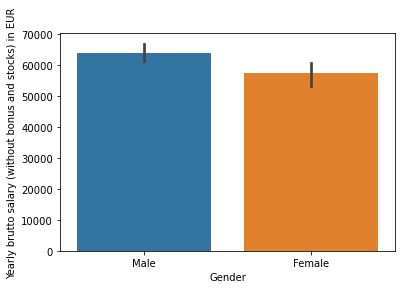

In [53]:
sns.barplot(x="Gender", y = "Yearly brutto salary (without bonus and stocks) in EUR", data=dfsoft1);
# The graph show that males get paid little more than females in SE

<AxesSubplot:xlabel='Total years of experience', ylabel='Yearly brutto salary (without bonus and stocks) in EUR'>

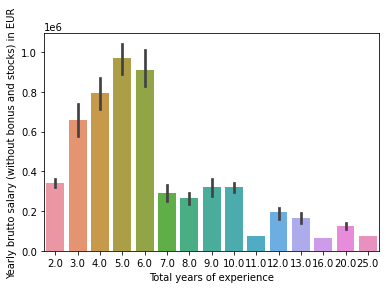

In [54]:
sns.barplot(data = dfsoft1 , x = 'Total years of experience' , y = 'Yearly brutto salary (without bonus and stocks) in EUR' , estimator=sum)
# The graph show that years of experience does not affect salary for whos working as SE
#(Salary does not increase with experience)

<AxesSubplot:xlabel='Yearly brutto salary (without bonus and stocks) in EUR', ylabel='Total years of experience'>

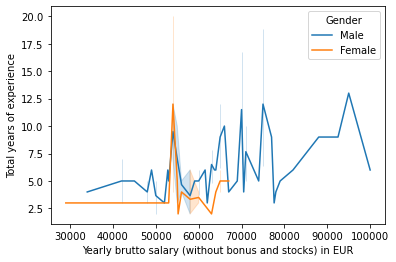

In [55]:
sns.lineplot(x="Yearly brutto salary (without bonus and stocks) in EUR", y="Total years of experience", hue="Gender", data=dfsoft1)
# For comparing between males and females in SE Salary does not affect by experience

### we compared betwwen middle Software engineering males and females (under the same condition)

In [56]:
dfds=df30.loc[df30['Position '] == 'Data Scientist']
dfds
# Get all DS employee

,Timestamp,Age,Gender,City,Position,Total years of experience,Seniority level,Yearly brutto salary (without bonus and stocks) in EUR,Yearly bonus + stocks in EUR,Employment status,Сontract duration,Main language at work,Company size,Company type,Have you lost your job due to the coronavirus outbreak?
66,24/11/2020 11:38:15,32.0,Male,Berlin,Data Scientist,10,Head,110000.0,30000,Full-time employee,Unlimited contract,English,1000+,Consulting / Agency,No
79,24/11/2020 11:44:02,26.0,Female,Munich,Data Scientist,6,Middle,60000.0,10000,Full-time employee,Unlimited contract,English,1000+,Product,No
88,24/11/2020 11:46:16,24.0,Male,Berlin,Data Scientist,4,Senior,73000.0,73000,Full-time employee,Unlimited contract,English,101-1000,Startup,No
90,24/11/2020 11:46:42,29.0,Male,Berlin,Data Scientist,4,Senior,81000.0,0,Full-time employee,Unlimited contract,English,101-1000,Product,No
109,24/11/2020 11:55:33,26.0,Male,Munich,Data Scientist,3,Middle,65000.0,7000,Full-time employee,Unlimited contract,English,101-1000,Product,No
123,24/11/2020 11:59:38,26.0,Female,Munich,Data Scientist,3,Junior,70000.0,12000,Full-time employee,Unlimited contract,English,1000+,Product,No
145,24/11/2020 12:09:55,26.0,Male,Münster,Data Scientist,5.5,Junior,48000.0,2000,Full-time employee,Unlimited contract,German,1000+,Product,No
160,24/11/2020 12:17:21,34.0,Male,Vienna,Data Scientist,12,Senior,77500.0,7750,Full-time employee,Unlimited contract,English,101-1000,Consulting / Agency,No
215,24/11/2020 13:21:22,34.0,Male,Berlin,Data Scientist,5,Middle,65000.0,5000,Full-time employee,Unlimited contract,English,101-1000,Product,No
240,24/11/2020 14:01:01,31.0,Female,Stuttgart,Data Scientist,4,Middle,65000.0,73000,Full-time employee,Unlimited contract,German,1000+,Product,No


In [57]:
dfDS1=dfds.loc[dfds['Seniority level'] == 'Senior']
dfDS1
# Get all Seniors DS employee


,Timestamp,Age,Gender,City,Position,Total years of experience,Seniority level,Yearly brutto salary (without bonus and stocks) in EUR,Yearly bonus + stocks in EUR,Employment status,Сontract duration,Main language at work,Company size,Company type,Have you lost your job due to the coronavirus outbreak?
88,24/11/2020 11:46:16,24.0,Male,Berlin,Data Scientist,4,Senior,73000.0,73000,Full-time employee,Unlimited contract,English,101-1000,Startup,No
90,24/11/2020 11:46:42,29.0,Male,Berlin,Data Scientist,4,Senior,81000.0,0,Full-time employee,Unlimited contract,English,101-1000,Product,No
160,24/11/2020 12:17:21,34.0,Male,Vienna,Data Scientist,12,Senior,77500.0,7750,Full-time employee,Unlimited contract,English,101-1000,Consulting / Agency,No
398,24/11/2020 19:31:46,32.0,Female,Cologne,Data Scientist,4,Senior,85000.0,88000,Full-time employee,Unlimited contract,English,1000+,consumer goods,No
518,25/11/2020 10:33:07,39.0,Male,Berlin,Data Scientist,7,Senior,70000.0,70000,Full-time employee,Unlimited contract,English,101-1000,Startup,No
563,25/11/2020 12:23:50,30.0,Female,Berlin,Data Scientist,6,Senior,76000.0,10000,Full-time employee,Unlimited contract,English,1000+,Product,No
575,25/11/2020 13:20:02,31.0,Male,Berlin,Data Scientist,6,Senior,78000.0,0,Full-time employee,Unlimited contract,English,1000+,E-commerce,No
593,25/11/2020 13:58:38,30.0,Male,Berlin,Data Scientist,6,Senior,72000.0,85000,Full-time employee,Unlimited contract,English,1000+,Startup,No
597,25/11/2020 14:00:28,38.0,Male,Berlin,Data Scientist,15,Senior,56000.0,59000,Full-time employee,Unlimited contract,English,Nov-50,Product,No
598,25/11/2020 14:02:47,39.0,Male,Hamburg,Data Scientist,10,Senior,80000.0,0,Full-time employee,Unlimited contract,English,1000+,Energy,No


In [58]:
arr = dfDS1['Total years of experience'].to_numpy()
arr

array(['4', '4', '12', '4', '7', '6', '6', '6', '15', '10', '6', '5', '6',
       '6', '8', '11', '8', '5', '2', '12', '5', '5', '5', '10', '5', '3',
       '5', '10', '10', '5', '4', '2', '6'], dtype=object)

In [59]:
arr = arr.astype(float)
dfDS1['Total years of experience']=arr

C:\Users\G A M I N G\AppData\Local\Temp\ipykernel_15096\1709474436.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfDS1['Total years of experience']=arr


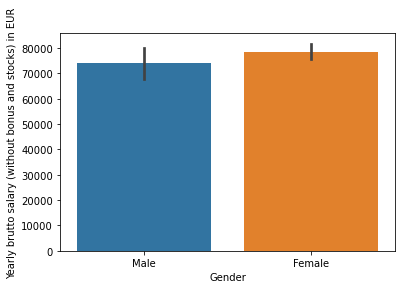

In [60]:
sns.barplot(x="Gender", y = "Yearly brutto salary (without bonus and stocks) in EUR", data=dfDS1);
# The graph show that females get paid little more than males in DS

<AxesSubplot:xlabel='Total years of experience', ylabel='Yearly brutto salary (without bonus and stocks) in EUR'>

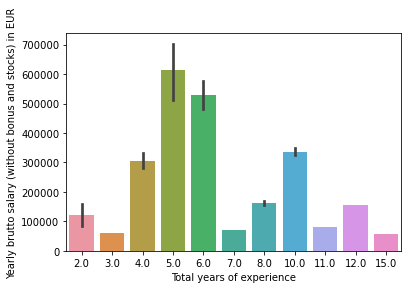

In [61]:
sns.barplot(data = dfDS1 , x = 'Total years of experience' , y = 'Yearly brutto salary (without bonus and stocks) in EUR' , estimator=sum)
# The graph show that years of experience does not affect salary for whos working as DS
#(Salary does not increase with experience)

<AxesSubplot:xlabel='Yearly brutto salary (without bonus and stocks) in EUR', ylabel='Total years of experience'>

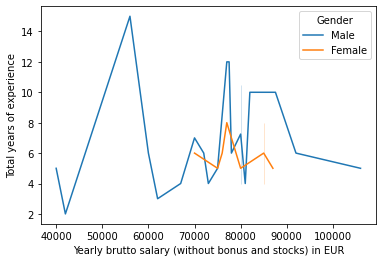

In [62]:
sns.lineplot(x="Yearly brutto salary (without bonus and stocks) in EUR", y="Total years of experience", hue="Gender", data=dfDS1)
# For comparing between males and females in DS Salary does not affect by experience

### We compared betwwen seniors data scientist males and females (under   the  same condition)

### The question answer:

### After comparing betwwen seniors data scientist males and females and comparing betwwen middle Software engineering males and females(under the same condition)

### we will find that differences in salaries are very small as in middle SE males get paid little more than females

### On the other hand in Senior DS females get paid little more than males in SE

### The answer: Male employees do not generating more income than female as explained in the previous graphs.



# ---------------------------------------------------------------------------------------------------------------



# During coronavirus in 2020 which technology job titles were lost?



In [63]:
dfQ3 = df[['Position ','Have you lost your job due to the coronavirus outbreak?','Company type']]

In [64]:
#Remove all outliers in Company type titles that have occurred less than 4
maskQ3 = dfQ3.groupby('Company type')['Company type'].transform('size') >4
dfQ3 = dfQ3.loc[maskQ3,:]
#Remove all answers that are not "Yes" or "No"
dfQ3 = dfQ3[dfQ3['Have you lost your job due to the coronavirus outbreak?'].isin(['Yes', 'No'])]
#dfQ3['Company type'].value_counts()
dfQ3['Have you lost your job due to the coronavirus outbreak?'].value_counts()
#dfQ3

No     930
Yes     43
Name: Have you lost your job due to the coronavirus outbreak?, dtype: int64

In [65]:
#Calculating the percentage of people who said "Yes"
dfgroupedQ3 = pd.DataFrame(dfQ3.groupby('Position ')['Have you lost your job due to the coronavirus outbreak?'].apply(lambda x: (x=='Yes').mean()))
#Multiplying by 100
dfgroupedQ3 = pd.DataFrame(dfgroupedQ3['Have you lost your job due to the coronavirus outbreak?'].apply(lambda x: (x*100)))
#Renaming the column to "Percentage of loss"
dfgroupedQ3.rename(columns = {'Have you lost your job due to the coronavirus outbreak?':'Percentage of loss'}, inplace = True)
dfgroupedQ3 = dfgroupedQ3.reset_index()
dfgroupedQ3

,Position,Percentage of loss
0,Backend Developer,2.597403
1,Business Analyst,0.000000
2,CTO,0.000000
3,Consultant,0.000000
4,Data Analyst,0.000000
5,Data Engineer,4.761905
6,Data Scientist,4.597701
7,Designer (UI/UX),13.333333
8,DevOps,6.122449
9,Engineering Manager,0.000000


<AxesSubplot:xlabel='Position '>

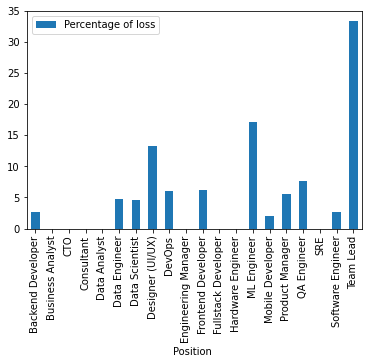

In [66]:
dfgroupedQ3.plot(kind = "bar", x='Position ')#, order= dfgroupedQ3.mean().sort_values(ascending=False).index)

### From the chart It appears that 'Team Lead' positions were the most affected by the outbreak, followed by Machine Learning and Design job Positions.
### The Least affected job positions were the Backend and Mobile Developers.

# ---------------------------------------------------------------------------------------------------------------


# Which job titles generate the highest income in small-size,mid-sized and large-sized companies?

In [67]:
#We're going to need certain columns only

dfQ4 = df[['Company size','Position ','Seniority level','Yearly brutto salary (without bonus and stocks) in EUR']].copy()

In [68]:
#Checking the unique values and how many times they're repeated
dfQ4['Company size'].value_counts()

1000+       357
101-1000    356
Nov-50      153
51-100      130
up to 10     41
Name: Company size, dtype: int64

In [69]:
#Changing the values of Company size to match a single format
dfQ4['Company size'] = dfQ4['Company size'].replace('up to 10','0-10')
dfQ4['Company size'] = dfQ4['Company size'].replace('Nov-50','11-50')
dfQ4['Company size'] = dfQ4['Company size'].replace('1000+','1000-inf')
#Quantiling the salaries to get rid of the outliers
q1 = dfQ4['Yearly brutto salary (without bonus and stocks) in EUR'].quantile(0.25)
q3 = dfQ4['Yearly brutto salary (without bonus and stocks) in EUR'].quantile(0.75)

iqr = q3 - q1
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr
dfQ4 = dfQ4[(dfQ4['Yearly brutto salary (without bonus and stocks) in EUR'] >= lower_bound) & (dfQ4['Yearly brutto salary (without bonus and stocks) in EUR'] <= upper_bound)]


In [70]:
#Dropping the rows that don't have Company size
dfQ4 = dfQ4.dropna(subset = ['Company size'])
#Adding a new column called Category which we will be splitting the company sizes into 3 different categories(Big,Medium,Small) depending on their size
dfQ4['Category'] = pd.cut(dfQ4['Company size'].apply(lambda x: int(x.split('-')[0])), bins=[-1,100,999,float('inf')], labels=['Small','Medium','Large'])

In [71]:
dfQ4

,Company size,Position,Seniority level,Yearly brutto salary (without bonus and stocks) in EUR,Category
0,51-100,Software Engineer,Senior,80000.0,Small
1,101-1000,Backend Developer,Senior,80000.0,Medium
3,51-100,Frontend Developer,Junior,54000.0,Small
4,101-1000,Backend Developer,Senior,62000.0,Medium
5,11-50,DevOps,Senior,76000.0,Small
6,11-50,Frontend Developer,Middle,57000.0,Small
7,1000-inf,Frontend Developer,Senior,65000.0,Large
8,101-1000,Backend Developer,Senior,56000.0,Medium
9,101-1000,Software Engineer,Lead,95000.0,Medium
10,101-1000,Data Engineer,Junior,52500.0,Medium


In [72]:
#Grouping each position's average salary depending on the company size
dfgrouped = pd.DataFrame(dfQ4.groupby(['Category', 'Position '])['Yearly brutto salary (without bonus and stocks) in EUR'].mean()).copy()

In [73]:
#Setting the display format to prevent pandas from using scientific format
pd.options.display.float_format = '{:.2f}'.format
#Dropping the null values
dfgrouped = dfgrouped.dropna()
dfgrouped

Yearly brutto salary (without bonus and stocks) in EUR
Category Position                                                                   
Small    Backend Developer                                             68218.37     
         Business Analyst                                              68500.00     
         CTO                                                           74666.67     
         Data Engineer                                                 58333.33     
         Data Scientist                                                63513.24     
         Designer (UI/UX)                                              57925.00     
         DevOps                                                        64358.33     
         Engineering Manager                                           85000.00     
         Frontend Developer                                            63884.83     
         Fullstack Developer                                           62750.00     
         Hardware Engineer                                             56000.00     
         ML Engineer                                                   62142.86     
         Mobile Developer                                              64094.44     
         Product Manager                                               63845.00     
         QA Engineer                                                   55266.67     
         Software Engineer                                             67002.44     
         Team Lead                                                     90000.00     
Medium   Backend Developer                                             69809.75     
         Business Analyst                                              65000.00     
         Consultant                                                    61500.00     
         Data Analyst                                                  64800.00     
         Data Engineer                                                 71681.82     
         Data Scientist                                                67412.50     
         DevOps                                                        73586.96     
         Engineering Manager                                           82000.00     
         Frontend Developer                                            62364.29     
         Hardware Engineer                                             75000.00     
         ML Engineer                                                   52500.00     
         Mobile Developer                                              67478.57     
         Product Manager                                               69125.00     
         QA Engineer                                                   61376.67     
         SRE                                                           71500.00     
         Software Engineer                                             71619.81     
         Team Lead                                                     75100.00     
Large    Backend Developer                                             73229.49     
         Consultant                                                   100000.00     
         Data Analyst                                                  70400.00     
         Data Engineer                                                 65888.89     
         Data Scientist                                                66957.89     
         Designer (UI/UX)                                              54285.71     
         DevOps                                                        79578.95     
         Engineering Manager                                           92600.00     
         Frontend Developer                                            69986.58     
         Hardware Engineer                                             83000.00     
         ML Engineer                                                   71968.75     
         Mobile Developer          

In [74]:
#Creating 3 dataframes for each category of company sizes
dfsmall = dfgrouped.groupby('Category').get_group('Small').copy()
dfsmall = dfsmall.reset_index()
dfmedium = dfgrouped.groupby('Category').get_group('Medium').copy()
dfmedium = dfmedium.reset_index()
dflarge = dfgrouped.groupby('Category').get_group('Large').copy()
dflarge = dflarge.reset_index()

In [75]:
dflarge

,Category,Position,Yearly brutto salary (without bonus and stocks) in EUR
0,Large,Backend Developer,73229.49
1,Large,Consultant,100000.00
2,Large,Data Analyst,70400.00
3,Large,Data Engineer,65888.89
4,Large,Data Scientist,66957.89
5,Large,Designer (UI/UX),54285.71
6,Large,DevOps,79578.95
7,Large,Engineering Manager,92600.00
8,Large,Frontend Developer,69986.58
9,Large,Hardware Engineer,83000.00


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16]),
 [Text(0, 0, 'Team Lead'),
  Text(1, 0, 'Engineering Manager'),
  Text(2, 0, 'CTO'),
  Text(3, 0, 'Business Analyst'),
  Text(4, 0, 'Backend Developer'),
  Text(5, 0, 'Software Engineer'),
  Text(6, 0, 'DevOps'),
  Text(7, 0, 'Mobile Developer'),
  Text(8, 0, 'Frontend Developer'),
  Text(9, 0, 'Product Manager'),
  Text(10, 0, 'Data Scientist'),
  Text(11, 0, 'Fullstack Developer'),
  Text(12, 0, 'ML Engineer'),
  Text(13, 0, 'Data Engineer'),
  Text(14, 0, 'Designer (UI/UX)'),
  Text(15, 0, 'Hardware Engineer'),
  Text(16, 0, 'QA Engineer')])

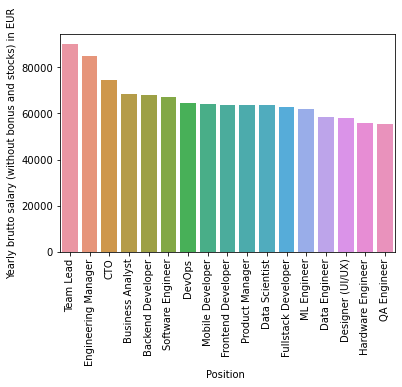

In [76]:
#Graphing the positions and sorting them descendingly to see which position pays the most
sns.barplot(data = dfsmall , x = 'Position ' , y = 'Yearly brutto salary (without bonus and stocks) in EUR',order=dfsmall.groupby('Position ')['Yearly brutto salary (without bonus and stocks) in EUR'].mean().sort_values(ascending=False).index) 
plt.xticks(rotation=90)


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16]),
 [Text(0, 0, 'Engineering Manager'),
  Text(1, 0, 'Team Lead'),
  Text(2, 0, 'Hardware Engineer'),
  Text(3, 0, 'DevOps'),
  Text(4, 0, 'Data Engineer'),
  Text(5, 0, 'Software Engineer'),
  Text(6, 0, 'SRE'),
  Text(7, 0, 'Backend Developer'),
  Text(8, 0, 'Product Manager'),
  Text(9, 0, 'Mobile Developer'),
  Text(10, 0, 'Data Scientist'),
  Text(11, 0, 'Business Analyst'),
  Text(12, 0, 'Data Analyst'),
  Text(13, 0, 'Frontend Developer'),
  Text(14, 0, 'Consultant'),
  Text(15, 0, 'QA Engineer'),
  Text(16, 0, 'ML Engineer')])

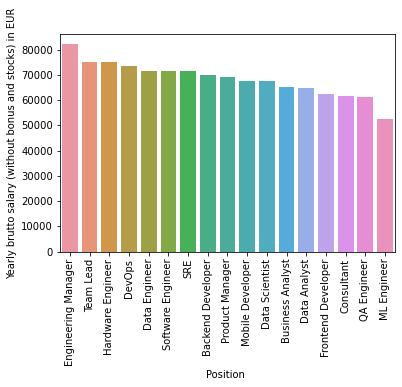

In [77]:
sns.barplot(data = dfmedium , x = 'Position ' , y = 'Yearly brutto salary (without bonus and stocks) in EUR',order=dfmedium.groupby('Position ')['Yearly brutto salary (without bonus and stocks) in EUR'].mean().sort_values(ascending=False).index) 
plt.xticks(rotation=90)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15]),
 [Text(0, 0, 'Consultant'),
  Text(1, 0, 'Engineering Manager'),
  Text(2, 0, 'Hardware Engineer'),
  Text(3, 0, 'DevOps'),
  Text(4, 0, 'Software Engineer'),
  Text(5, 0, 'Product Manager'),
  Text(6, 0, 'Backend Developer'),
  Text(7, 0, 'SRE'),
  Text(8, 0, 'ML Engineer'),
  Text(9, 0, 'Mobile Developer'),
  Text(10, 0, 'Data Analyst'),
  Text(11, 0, 'Frontend Developer'),
  Text(12, 0, 'Data Scientist'),
  Text(13, 0, 'Data Engineer'),
  Text(14, 0, 'QA Engineer'),
  Text(15, 0, 'Designer (UI/UX)')])

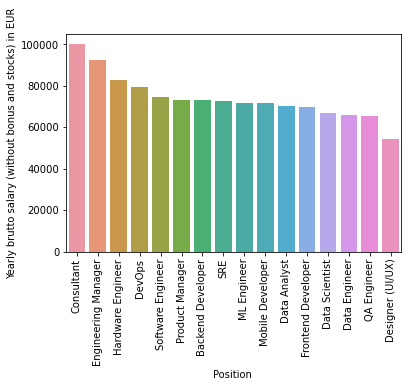

In [78]:
sns.barplot(data = dflarge , x = 'Position ' , y = 'Yearly brutto salary (without bonus and stocks) in EUR',order=dflarge.groupby('Position ')['Yearly brutto salary (without bonus and stocks) in EUR'].mean().sort_values(ascending=False).index) 
plt.xticks(rotation=90)

### We can see that there most positions are not really affected depending on the company size like "Software architect" which stays at the top of the salaries wherever it exists and engineering manager which stays at the top 3 in all 3 categories

###  However we can also see that some positions like the Consultant change significantly depending on the company size. Large companies tend to pay consultants really high compared to medium sized companies smaller companies lack the role.
### Another example of  a position that is dependant on the company size is the Team leader where we can see the same pattern that the consultant position had but reversed. Smaller companies tend to pay Team leaders more than medium sized companies while larger companies lack the role.

<AxesSubplot:xlabel='Category', ylabel='Position '>

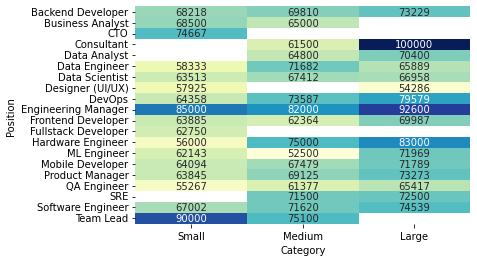

In [79]:
heatmap_data = pd.pivot_table(dfgrouped, values='Yearly brutto salary (without bonus and stocks) in EUR', index='Position ', columns='Category')
sns.heatmap(heatmap_data, cmap='YlGnBu', annot=True, fmt='.0f', cbar=False)

### We can also see that on average all positions's salaries are directly proportional to the company size, meaning that the bigger the company the better the pay for the position on average.

# ---------------------------------------------------------------------------------------------------------------


# Which job title values years of experience the most?



In [80]:
df2 = df.drop(['Timestamp', 'Gender', 'City', 'Years of experience in Germany',
       'Your main technology / programming language',
       'Other technologies/programming languages you use often',
       'Number of vacation days', 'Employment status', 'Сontract duration',
       'Main language at work', 'Company size', 'Company type',
       'Have you lost your job due to the coronavirus outbreak?', 'Yearly bonus + stocks in EUR',
       'Annual brutto salary (without bonus and stocks) one year ago. Only answer if staying in the same country',
       'Annual bonus+stocks one year ago. Only answer if staying in same country', 'Age', 'Seniority level'], axis=1)
#df2

### The two functions will be used to extract the needed features and their values from the cleaned dataset.
### These functions will be called with every job position.

- The 'extractSalaries' function divides the chosen job position records into categories based on their years of experiences. Each category is represented in a data frame. The five categories are:

                >> From 0 to 4           
                >> From 4 to 8
                >> From 8 to 12
                >> From 12 to 16
                >> From 16 to 20
                >> Over 20 years of experience
                
- After that the minumum and maximum salary values for each 'Years of experience' category are retrieved and put into lists.
- Then their averages are calculated and added to each corresponding years of experience category.

- Finally, all the data frames are outer merged into one. This outputs a new data frame that combines all divided records and their relevant data for each job position.

In [81]:
def setJobPosition(s):
    df4 = df2.where(df2['Position '] == s)
    df4 = df4.dropna(axis=0, how="any")
    return df4
    
def extractSalaries(df4):
    arr1 = df4['Total years of experience'].to_numpy()
    i1 = np.where(arr1 == 'less than year')
    arr1[i1] = 0

    i1 = np.where(arr1 == '1,5')
    arr1[i1] = 0

    i1 = np.where(arr1 == '6 (not as a data scientist, but as a lab scientist)')
    arr1[i1] = 6

    i1 = i1 = np.where(arr1 == '1 (as QA Engineer) / 11 in total')
    arr1[i1] = 11

    arr1 = arr1.astype(float)
    
    z = len(df4.index)
    
    df4['id'] = [x for x in range(z)]

    df4['Total years of experience'] = arr1

    df5 = df4.where(df4['Total years of experience'] >= 0)
    df6 = df5.where(df5['Total years of experience'] < 4)
    df6['Years of XP'] = ["0 to 4" for x in range(z)]


    df5 = df4.where(df4['Total years of experience'] >= 4)
    df7 = df5.where(df5['Total years of experience'] < 8)
    df7['Years of XP'] = ["4 to 8" for x in range(z)]


    df5 = df4.where(df4['Total years of experience'] >= 8)
    df8 = df5.where(df5['Total years of experience'] < 12)
    df8['Years of XP'] = ["8 to 12" for x in range(z)]


    df5 = df4.where(df4['Total years of experience'] >= 12)
    df9 = df5.where(df5['Total years of experience'] < 16)
    df9['Years of XP'] = ["12 to 16" for x in range(z)]


    df5 = df4.where(df4['Total years of experience'] >= 16)
    df10 = df5.where(df5['Total years of experience'] < 20)
    df10['Years of XP'] = ["16 to 20" for x in range(z)]


    df11 = df4.where(df4['Total years of experience'] >= 20)
    df11['Years of XP'] = ["Over 20" for x in range(z)]

    listminSE = []
    listmaxSE = []
    listavgSE = []

    listminSE.append(df6['Yearly brutto salary (without bonus and stocks) in EUR'].min())
    listmaxSE.append(df6['Yearly brutto salary (without bonus and stocks) in EUR'].max())

    listminSE.append(df7['Yearly brutto salary (without bonus and stocks) in EUR'].min())
    listmaxSE.append(df7['Yearly brutto salary (without bonus and stocks) in EUR'].max())

    listminSE.append(df8['Yearly brutto salary (without bonus and stocks) in EUR'].min())
    listmaxSE.append(df8['Yearly brutto salary (without bonus and stocks) in EUR'].max())

    listminSE.append(df9['Yearly brutto salary (without bonus and stocks) in EUR'].min())
    listmaxSE.append(df9['Yearly brutto salary (without bonus and stocks) in EUR'].max())

    listminSE.append(df10['Yearly brutto salary (without bonus and stocks) in EUR'].min())
    listmaxSE.append(df10['Yearly brutto salary (without bonus and stocks) in EUR'].max())

    listminSE.append(df11['Yearly brutto salary (without bonus and stocks) in EUR'].min())
    listmaxSE.append(df11['Yearly brutto salary (without bonus and stocks) in EUR'].max())


    values1 = range(6)

    for i in values1:
        listavgSE.append((listminSE[i] + listmaxSE[i])/2)

    df6['Average Salary'] = [listavgSE[0] for i in range(z)]
    df7['Average Salary'] = [listavgSE[1] for i in range(z)]
    df8['Average Salary'] = [listavgSE[2] for i in range(z)]
    df9['Average Salary'] = [listavgSE[3] for i in range(z)]
    df10['Average Salary'] = [listavgSE[4] for i in range(z)]
    df11['Average Salary'] = [listavgSE[5] for i in range(z)]

    df6 = df6.dropna(axis=0, how="any")
    df7 = df7.dropna(axis=0, how="any")
    df8 = df8.dropna(axis=0, how="any")
    df9 = df9.dropna(axis=0, how="any")
    df10 = df10.dropna(axis=0, how="any")
    df11=df11.dropna(axis=0, how="any")
    
    df12 = pd.merge(df6, df7, 'outer', on=['id', 'Position ', 'Years of XP', 'Total years of experience', 'Yearly brutto salary (without bonus and stocks) in EUR', 'Average Salary'])
    df13 = pd.merge(df8, df9, 'outer', on=['id', 'Position ', 'Years of XP', 'Total years of experience', 'Yearly brutto salary (without bonus and stocks) in EUR', 'Average Salary'])
    df14 = pd.merge(df10, df11, 'outer', on=['id', 'Position ', 'Years of XP', 'Total years of experience', 'Yearly brutto salary (without bonus and stocks) in EUR', 'Average Salary'])
    df15 = pd.merge(df12, df13, 'outer')
    df16 = pd.merge(df15, df14, 'outer')
    return df16

# SOFTWARE ENGINEER

In [82]:
#df4 = df2.where(df2['Position '] == "Software Engineer")
#df4 = df4.dropna(axis=0, how="any")
df4 = setJobPosition("Software Engineer")
df4

,Position,Total years of experience,Yearly brutto salary (without bonus and stocks) in EUR
0,Software Engineer,5,80000.00
9,Software Engineer,15,95000.00
11,Software Engineer,25,100000.00
13,Software Engineer,14,70000.00
22,Software Engineer,5,65000.00
24,Software Engineer,17,70000.00
30,Software Engineer,6,85000.00
33,Software Engineer,8,80000.00
34,Software Engineer,8,63000.00
37,Software Engineer,8,80000.00


In [83]:
dff = extractSalaries(df4)

<AxesSubplot:xlabel='Years of XP', ylabel='Average Salary'>

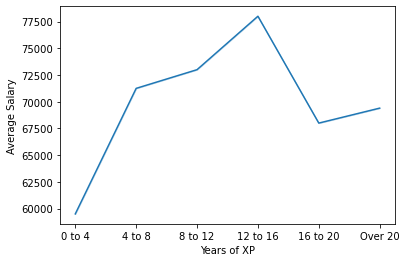

In [84]:
sns.lineplot(data=dff, x='Years of XP', y='Average Salary')

### The outcome shows the average distribution of salaries with respect to the years of experience for Software Engineers.

# BACKEND DEVELOPER

In [85]:
df4 = setJobPosition("Backend Developer")
df4

,Position,Total years of experience,Yearly brutto salary (without bonus and stocks) in EUR
1,Backend Developer,7,80000.00
4,Backend Developer,17,62000.00
8,Backend Developer,8,56000.00
15,Backend Developer,5,75000.00
16,Backend Developer,7,60350.00
18,Backend Developer,8,60000.00
23,Backend Developer,30,69000.00
31,Backend Developer,5,65000.00
38,Backend Developer,5,75000.00
47,Backend Developer,3,77000.00


In [86]:
dff2 = extractSalaries(df4)

<AxesSubplot:xlabel='Years of XP', ylabel='Average Salary'>

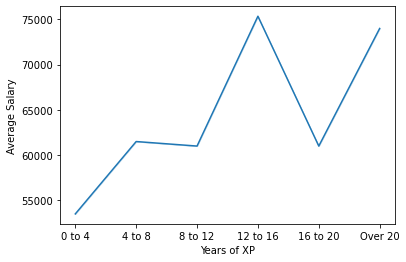

In [87]:
sns.lineplot(data=dff2, x='Years of XP', y='Average Salary')

### The outcome shows the average distribution of salaries with respect to the years of experience for Backend Developers.

# DATA SCIENTIST

In [88]:
df4 = setJobPosition("Data Scientist")
dff3 = extractSalaries(df4)
dff3

,Position,Total years of experience,Yearly brutto salary (without bonus and stocks) in EUR,id,Years of XP,Average Salary
0,Data Scientist,3.00,65000.00,4.00,0 to 4,56000.00
1,Data Scientist,3.00,70000.00,5.00,0 to 4,56000.00
2,Data Scientist,2.00,54000.00,10.00,0 to 4,56000.00
3,Data Scientist,2.00,48000.00,11.00,0 to 4,56000.00
4,Data Scientist,3.00,58000.00,13.00,0 to 4,56000.00
5,Data Scientist,2.00,48000.00,14.00,0 to 4,56000.00
6,Data Scientist,1.00,57600.00,16.00,0 to 4,56000.00
7,Data Scientist,2.00,47000.00,17.00,0 to 4,56000.00
8,Data Scientist,2.00,54000.00,18.00,0 to 4,56000.00
9,Data Scientist,2.00,62000.00,28.00,0 to 4,56000.00


<AxesSubplot:xlabel='Years of XP', ylabel='Average Salary'>

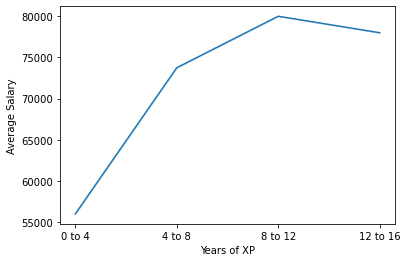

In [89]:
sns.lineplot(data=dff3, x='Years of XP', y='Average Salary')

### The outcome shows the average distribution of salaries with respect to the years of experience for Data Scientists.

# FRONTEND DEVELOPER

In [90]:
df4 = setJobPosition("Frontend Developer")
dff4 = extractSalaries(df4)
dff4

,Position,Total years of experience,Yearly brutto salary (without bonus and stocks) in EUR,id,Years of XP,Average Salary
0,Frontend Developer,1.00,37500.00,17.00,0 to 4,53750.00
1,Frontend Developer,3.00,70000.00,24.00,0 to 4,53750.00
2,Frontend Developer,3.00,44000.00,26.00,0 to 4,53750.00
3,Frontend Developer,2.00,64000.00,31.00,0 to 4,53750.00
4,Frontend Developer,2.00,47000.00,35.00,0 to 4,53750.00
5,Frontend Developer,3.00,43000.00,43.00,0 to 4,53750.00
6,Frontend Developer,3.00,54500.00,47.00,0 to 4,53750.00
7,Frontend Developer,3.00,48000.00,56.00,0 to 4,53750.00
8,Frontend Developer,2.00,40000.00,61.00,0 to 4,53750.00
9,Frontend Developer,3.00,57600.00,80.00,0 to 4,53750.00


<AxesSubplot:xlabel='Years of XP', ylabel='Average Salary'>

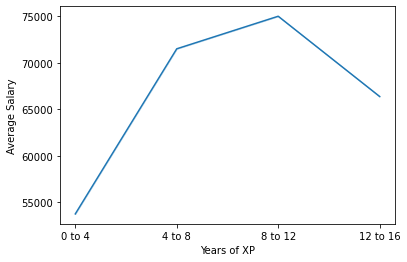

In [91]:
sns.lineplot(data=dff4, x='Years of XP', y='Average Salary')

### The outcome shows the average distribution of salaries with respect to the years of experience for Frontend Developers.

# QA ENGINEER

In [92]:
df4 = setJobPosition("QA Engineer")
dff5 = extractSalaries(df4)
dff5

,Position,Total years of experience,Yearly brutto salary (without bonus and stocks) in EUR,id,Years of XP,Average Salary
0,QA Engineer,3.00,55000.00,56.00,0 to 4,43500.00
1,QA Engineer,2.00,32000.00,59.00,0 to 4,43500.00
2,QA Engineer,7.00,45000.00,0.00,4 to 8,55750.00
3,QA Engineer,5.00,60000.00,3.00,4 to 8,55750.00
4,QA Engineer,6.00,62000.00,4.00,4 to 8,55750.00
5,QA Engineer,5.00,58000.00,5.00,4 to 8,55750.00
6,QA Engineer,6.00,50000.00,6.00,4 to 8,55750.00
7,QA Engineer,6.00,65000.00,7.00,4 to 8,55750.00
8,QA Engineer,7.00,68000.00,9.00,4 to 8,55750.00
9,QA Engineer,6.00,60000.00,11.00,4 to 8,55750.00


<AxesSubplot:xlabel='Years of XP', ylabel='Average Salary'>

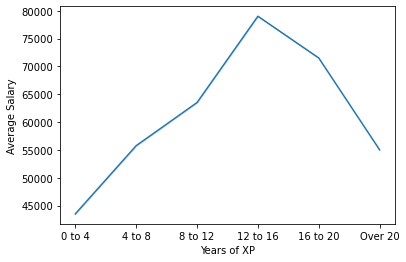

In [93]:
sns.lineplot(data=dff5, x='Years of XP', y='Average Salary')

### The outcome shows the average distribution of salaries with respect to the years of experience for QA Engineers.

# DEVOPS

In [94]:
df4 = setJobPosition("DevOps")
dff6 = extractSalaries(df4)
#dff6

<AxesSubplot:xlabel='Years of XP', ylabel='Average Salary'>

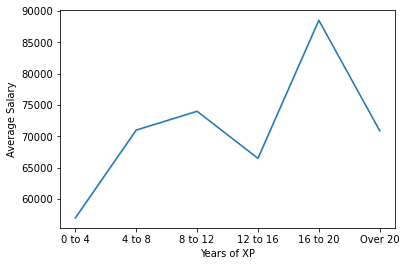

In [95]:
sns.lineplot(data=dff6, x='Years of XP', y='Average Salary')

### The outcome shows the average distribution of salaries with respect to the years of experience for DevOps Engineers.

# MOBILE DEVELOPER

In [96]:
df4 = setJobPosition("Mobile Developer")
dff7 = extractSalaries(df4)
#dff7

<AxesSubplot:xlabel='Years of XP', ylabel='Average Salary'>

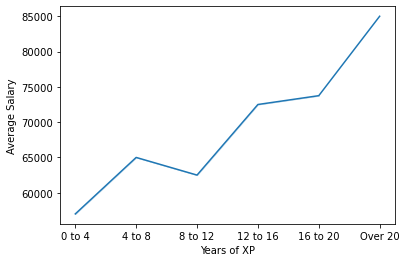

In [97]:
sns.lineplot(data=dff7, x='Years of XP', y='Average Salary')

### The outcome shows the average distribution of salaries with respect to the years of experience for Mobile Developers.

# ALL

### The resulting dataframes for each job position are outer merged with each other to obtain one inclusive dataframe that holds the categorical years of experience, main and average salaries.
### This dataframe will be the final one to visualize a comparison among all analyzed job positions.

In [98]:
df23 = pd.merge(dff, dff2, 'outer', on=['id', 'Position ', 'Years of XP', 'Total years of experience', 'Yearly brutto salary (without bonus and stocks) in EUR', 'Average Salary'])
df24 = pd.merge(dff3, dff4, 'outer', on=['id', 'Position ', 'Years of XP', 'Total years of experience', 'Yearly brutto salary (without bonus and stocks) in EUR', 'Average Salary'])
df25 = pd.merge(dff5, dff6, 'outer', on=['id', 'Position ', 'Years of XP', 'Total years of experience', 'Yearly brutto salary (without bonus and stocks) in EUR', 'Average Salary'])
df26 = pd.merge(df23, df24, 'outer',on=['id', 'Position ', 'Years of XP', 'Total years of experience', 'Yearly brutto salary (without bonus and stocks) in EUR', 'Average Salary'])
df27 = pd.merge(df25, df26, 'outer',on=['id', 'Position ', 'Years of XP', 'Total years of experience', 'Yearly brutto salary (without bonus and stocks) in EUR', 'Average Salary'])
df28 = pd.merge(df27, dff7, 'outer', on=['id', 'Position ', 'Years of XP', 'Total years of experience', 'Yearly brutto salary (without bonus and stocks) in EUR', 'Average Salary'])
#df27

<AxesSubplot:xlabel='Years of XP', ylabel='Average Salary'>

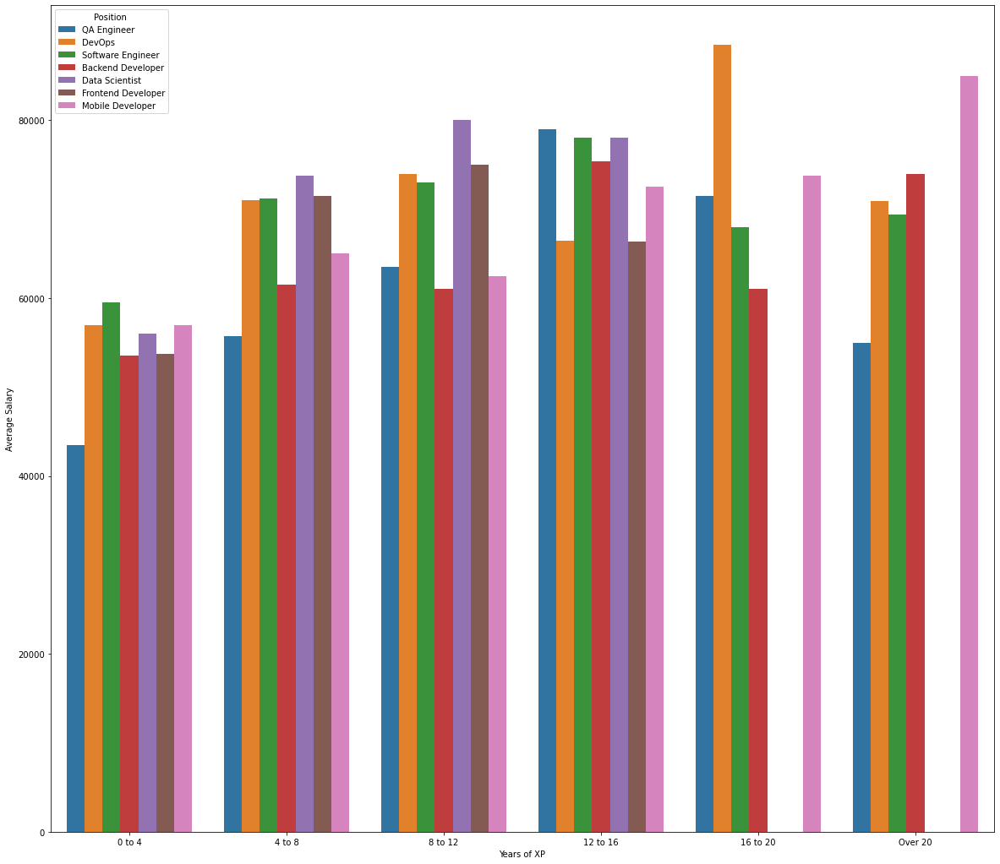

In [99]:
plt.rcParams['figure.figsize']=(20,18)
sns.barplot(data = df28, x="Years of XP", y="Average Salary", hue = 'Position ')

## From the obtained dataset, the final chart shows that:

- All job positions except DevOps positions appear progressive for young tech employees looking to spend over a decade in those fields.
- DevOps postions' salaries appears more within range for tech employees having over 4 years of experience.
- 'Mobile Development' job position seems the only position that values years of experience as the peak salary coincides with the maximum experience years. This is not the case with the rest of job positions.
- Most of the job positions have peak average salaries at "12-16" years of experience and most of them have dropping salaries at the maximum years of experience.

# Project 2


# Considering Europe-based Mobile Developers and Software Engineers, what are their chances of finding a similar job opportunity in Singapore satisfying its exact job requirements?

In [100]:
import requests
from bs4 import BeautifulSoup

### The two functions are used to scrape data from a job listing website in Singapore.
### The scrapePage function extracts the job title as well as the company name and calls the getMore function which gets two inner details of each job reqirement: Career Level and Years of Experience. 

In [101]:
jobTitle=[] 
Company=[] #Company Name
cLevel=[] #Career Level
YXP=[] #Years of Experience required for the job

def getMore(f): #'f' is the 'href' link for each job offer. The link goes to another webpage that has extra required details for the job.
    req2 = requests.get(f)
    con2 = BeautifulSoup(req2.text, 'html.parser')
    z = con2.find('div', 'z1s6m00 _1hbhsw66y _1hbhsw673 _1hbhsw674 _1hbhsw682 _1hbhsw687 _1hbhsw688 _1hbhsw69q _1hbhsw68m y44q7i18 y44q7i1b _1hbhsw632 _1hbhsw635').find('div', 'z1s6m00 _5135ge0 _5135ge7 _5135gei').find('div', 'z1s6m00 _1hbhsw65a _1hbhsw6gi _5135ge2f').find_all('div', 'z1s6m00 _1hbhsw6r pmwfa50 pmwfa57')
    zf = z[0].find_all('div', 'z1s6m00 _1hbhsw66q')
    zz = zf[1].find('span').text.strip()
    cLevel.append(zz)
    zz = z[2].find_all('div', 'z1s6m00 _1hbhsw66q')
    zzz = zz[1].find('span').text.strip()
    YXP.append(zzz)



def scrapePage(page, pos):  #'page' is an integer, and 'pos' is a string that represents the job position.
    req = requests.get(f"https://www.jobstreet.com.sg/{pos}-jobs?persist=specialization&pg={page}&specialization=508")
    con = req.text
    con = BeautifulSoup(con, 'html.parser')
    a = con.find('div', 'z1s6m00 iw87102').find('div', 'z1s6m00 _1hbhsw6ce').find('div', 'z1s6m00')
    b = a.find_all('div', 'z1s6m00 _1hbhsw69y _1hbhsw68u _1hbhsw67e _1hbhsw67q')
    for item in b:
        c = item.find('div', 'z1s6m00')
        d = c.find('h1').text.strip()
        t = c.find('h1').find('a').get('href')
        e = c.find('span', 'z1s6m00 _17dyj7u1 _1hbhsw64y _1hbhsw60 _1hbhsw6r').text.strip()
        getMore(f"https://www.jobstreet.com.sg{t}") #Passing the link to the getMore function to scrape more details about the job.
        jobTitle.append(d)
        Company.append(e)        

In [102]:
i = 2 
for i in range(15): #Scraping over 12 pages of job listings in Singapore for mobile developers and software engineers.
    scrapePage(i, 'mobile-developer')
    scrapePage(i, 'software-engineer')

In [103]:
jT=[]

def cleanJobTitle():  #The function aims to clean the extracted job titles using regex to match those with the main dataset.
    reg = r"([_,[#|.@()$-]).+"  #Removes special characters within the job title.
    i = 1
    for i in jobTitle:
        t = re.sub(reg, '', i)
        i = re.sub(r"\s+$", "", t)  #Removes white space at the end.
        jT.append(i) #The new job title after cleaning.

In [104]:
newYXP = []

def cleanXP():  #The function aims to clean the extracted years of experience using regex to match those with the main dataset.
    rege = r"\D+"
    i = 0
    for i in YXP:
        if i != 'Full-Time' and re.search('^\d', i):
            e = re.split(rege, i)  #The scraped years of xp are text like '2 years', this text is splitted and only the first index is taken.
            newYXP.append(int(e[0])) #There is another way of extracting it by matching with the digit directly as r"\d+"
        else:
            newYXP.append(i) #Despite useless data, just scrape to avoid messing up the records.

### Two new regex values are used to further clean the job titles to match those with the dataset and avoid redundancy. For example, An android developer, an iOS developer, a mobile app dev are all 'Mobile Developers'.

In [105]:
cleanJobTitle()
cleanXP()
o = []


reg = "(.+((Mobile)|(Android)|([iI]OS)).+)|(((Mobile)|(Android)|([iI]OS)).+)"
reg2 = "(.+(Software).+)|((Software).+)"

for i in jT:
    if re.search('(Software)+', i):
        o.append(re.sub(reg2, "Software Engineer", i))
    else:
        o.append(re.sub(reg, "Mobile Developer", i))


In [106]:
r = pd.DataFrame({'Job Title' : o, 'Company Name': Company, 'Career Level': cLevel, 'XP Years': newYXP})

In [107]:
g = ('Mobile Developer', 'Software Engineer')
r2 = r.where(r['Job Title'].isin(g))
r2 

,Job Title,Company Name,Career Level,XP Years
0,Mobile Developer,Peoplebank Singapore Pte Ltd,Senior Executive,3
1,Software Engineer,Adecco Personnel Pte Ltd.,Manager,Full-Time
2,Mobile Developer,ScienTec Personnel,Junior Executive,4
3,Mobile Developer,Michael Page International Pte Ltd,Non-Executive,3
4,NaN,NaN,NaN,NaN
5,Mobile Developer,Talent Trader Group Pte Ltd,Junior Executive,1
6,Software Engineer,TRUST RECRUIT PTE. LTD.,Junior Executive,1
7,Software Engineer,Good Job Creations (Singapore) Pte Ltd,Senior Executive,3
8,Mobile Developer,HR Business Partners International Pte Ltd,Senior Executive,3
9,Mobile Developer,GATEWAY SEARCH PTE LTD,Non-Executive,3


In [108]:
r2.isnull().sum()

Job Title       280
Company Name    280
Career Level    280
XP Years        280
dtype: int64

In [109]:
r2.dropna(axis=0, how='any', inplace=True)
r2.shape

(620, 4)

In [110]:
r2 #The final dataframe with 'Mobile Developers' and 'Software Engineers'

,Job Title,Company Name,Career Level,XP Years
0,Mobile Developer,Peoplebank Singapore Pte Ltd,Senior Executive,3
1,Software Engineer,Adecco Personnel Pte Ltd.,Manager,Full-Time
2,Mobile Developer,ScienTec Personnel,Junior Executive,4
3,Mobile Developer,Michael Page International Pte Ltd,Non-Executive,3
5,Mobile Developer,Talent Trader Group Pte Ltd,Junior Executive,1
6,Software Engineer,TRUST RECRUIT PTE. LTD.,Junior Executive,1
7,Software Engineer,Good Job Creations (Singapore) Pte Ltd,Senior Executive,3
8,Mobile Developer,HR Business Partners International Pte Ltd,Senior Executive,3
9,Mobile Developer,GATEWAY SEARCH PTE LTD,Non-Executive,3
10,Mobile Developer,PERSOLKELLY Singapore Pte Ltd (Formerly Kelly ...,Senior Executive,5


In [111]:
r2['Career Level'].unique()

array(['Senior Executive', 'Manager', 'Junior Executive', 'Non-Executive',
       'Entry Level', 'Senior Manager', 'Not Specified'], dtype=object)

In [112]:
r2 = r2.where(r2['XP Years'] != 'Full-Time')

In [113]:
r2.dropna(axis=0, how='any', inplace=True)

### For simplifying merging with the main dataset, Career Levels of the new dataset are renamed to match the 'Seniority level' values in the main dataset.

In [114]:
r2['Career Level'] = r2['Career Level'].replace('Senior Executive', 'Senior')
r2['Career Level'] = r2['Career Level'].replace('Senior Manager', 'Senior')
r2['Career Level'] = r2['Career Level'].replace('Entry Level', 'Junior')
r2['Career Level'] = r2['Career Level'].replace('Junior Executive', 'Junior')
r2['Career Level'] = r2['Career Level'].replace('Manager', 'Head')
r2['Career Level'] = r2['Career Level'].replace('Non-Executive', 'Middle')

In [115]:
df['Seniority level'].unique()

array(['Senior', 'Junior', 'Middle', 'Lead', 'Head', nan, 'No level',
       'Principal', 'no idea, there are no ranges in the firm '],
      dtype=object)

In [116]:
r2['Career Level'].unique()

array(['Senior', 'Junior', 'Middle', 'Head', 'Not Specified'],
      dtype=object)

In [117]:
r2.drop('Company Name', axis=1, inplace=True)

In [118]:
r2.reset_index(inplace = True)

In [119]:
r2.drop('index', axis=1, inplace=True)
r2

,Job Title,Career Level,XP Years
0,Mobile Developer,Senior,3
1,Mobile Developer,Junior,4
2,Mobile Developer,Middle,3
3,Mobile Developer,Junior,1
4,Software Engineer,Junior,1
5,Software Engineer,Senior,3
6,Mobile Developer,Senior,3
7,Mobile Developer,Middle,3
8,Mobile Developer,Senior,5
9,Mobile Developer,Senior,7


### The purpose of the new column is to count the number of ocurrences of each complete record in the scrapped dataset. This is to find, for example, how many job offers offered for a senior mobile developer with 3 years of experience in Singapore.

In [120]:
r2['Occurence'] = 0
r2

,Job Title,Career Level,XP Years,Occurence
0,Mobile Developer,Senior,3,0
1,Mobile Developer,Junior,4,0
2,Mobile Developer,Middle,3,0
3,Mobile Developer,Junior,1,0
4,Software Engineer,Junior,1,0
5,Software Engineer,Senior,3,0
6,Mobile Developer,Senior,3,0
7,Mobile Developer,Middle,3,0
8,Mobile Developer,Senior,5,0
9,Mobile Developer,Senior,7,0


In [121]:
i = 0
for i in range(len(r2)):
    j = i+1
    for j in range(len(r2)):
        if r2.loc[i, 'Career Level'] == r2.loc[j, 'Career Level'] and r2.loc[i, 'XP Years'] == r2.loc[j, 'XP Years']:
            r2.loc[i, 'Occurence'] +=1

In [122]:
r3 = r2

In [123]:
r3['XP Years'] = [str(r3['XP Years'][i]) for i in range(len(r3))]

In [124]:
r3['S+XP'] = r3['Job Title'] + "--" + r3['XP Years'] + "--" + r3['Career Level']

In [125]:
r3

,Job Title,Career Level,XP Years,Occurence,S+XP
0,Mobile Developer,Senior,3,56,Mobile Developer--3--Senior
1,Mobile Developer,Junior,4,9,Mobile Developer--4--Junior
2,Mobile Developer,Middle,3,6,Mobile Developer--3--Middle
3,Mobile Developer,Junior,1,133,Mobile Developer--1--Junior
4,Software Engineer,Junior,1,133,Software Engineer--1--Junior
5,Software Engineer,Senior,3,56,Software Engineer--3--Senior
6,Mobile Developer,Senior,3,56,Mobile Developer--3--Senior
7,Mobile Developer,Middle,3,6,Mobile Developer--3--Middle
8,Mobile Developer,Senior,5,113,Mobile Developer--5--Senior
9,Mobile Developer,Senior,7,11,Mobile Developer--7--Senior


In [126]:
r3['Chances of finding a job in Singapore'] = r3['Occurence']*100/len(r3)

### The following chart just visualizes the demand for seniority levels with specific years of xp using number of occurrences in Singapore. As shown, the number of occurences of a junior mobile developer and a junior software engineer with 1 year of experience is the largest.

<AxesSubplot:xlabel='Chances of finding a job in Singapore', ylabel='S+XP'>

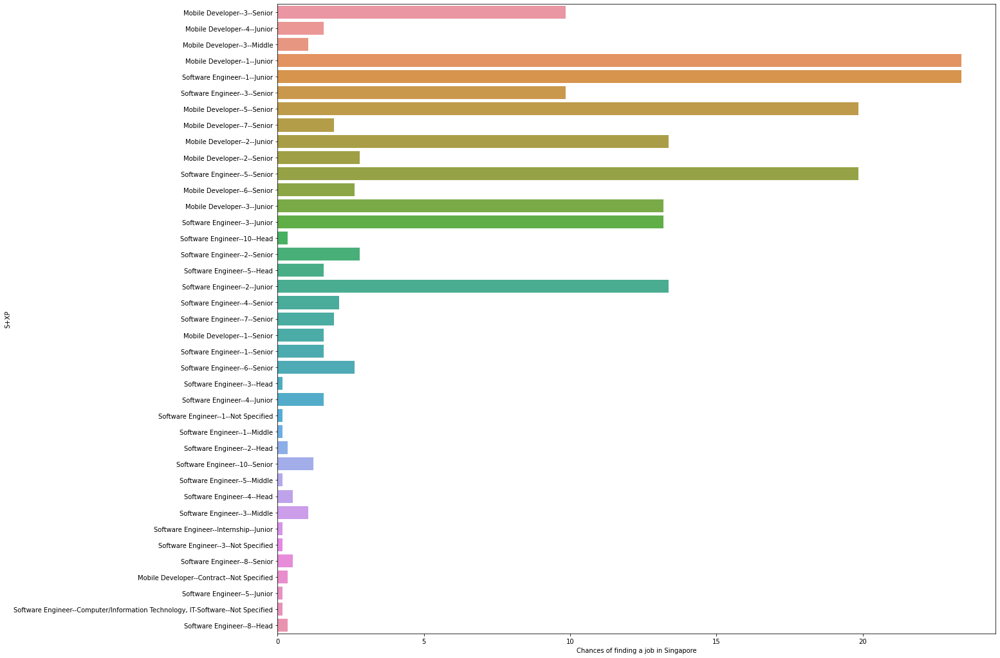

In [127]:
sns.barplot(data=r3, y='S+XP', x= 'Chances of finding a job in Singapore')

In [128]:
r3

,Job Title,Career Level,XP Years,Occurence,S+XP,Chances of finding a job in Singapore
0,Mobile Developer,Senior,3,56,Mobile Developer--3--Senior,9.84
1,Mobile Developer,Junior,4,9,Mobile Developer--4--Junior,1.58
2,Mobile Developer,Middle,3,6,Mobile Developer--3--Middle,1.05
3,Mobile Developer,Junior,1,133,Mobile Developer--1--Junior,23.37
4,Software Engineer,Junior,1,133,Software Engineer--1--Junior,23.37
5,Software Engineer,Senior,3,56,Software Engineer--3--Senior,9.84
6,Mobile Developer,Senior,3,56,Mobile Developer--3--Senior,9.84
7,Mobile Developer,Middle,3,6,Mobile Developer--3--Middle,1.05
8,Mobile Developer,Senior,5,113,Mobile Developer--5--Senior,19.86
9,Mobile Developer,Senior,7,11,Mobile Developer--7--Senior,1.93


In [129]:
r4 = r3.drop(['S+XP'], axis=1)
r4

,Job Title,Career Level,XP Years,Occurence,Chances of finding a job in Singapore
0,Mobile Developer,Senior,3,56,9.84
1,Mobile Developer,Junior,4,9,1.58
2,Mobile Developer,Middle,3,6,1.05
3,Mobile Developer,Junior,1,133,23.37
4,Software Engineer,Junior,1,133,23.37
5,Software Engineer,Senior,3,56,9.84
6,Mobile Developer,Senior,3,56,9.84
7,Mobile Developer,Middle,3,6,1.05
8,Mobile Developer,Senior,5,113,19.86
9,Mobile Developer,Senior,7,11,1.93


In [130]:
dfkk = df

In [131]:
r4

,Job Title,Career Level,XP Years,Occurence,Chances of finding a job in Singapore
0,Mobile Developer,Senior,3,56,9.84
1,Mobile Developer,Junior,4,9,1.58
2,Mobile Developer,Middle,3,6,1.05
3,Mobile Developer,Junior,1,133,23.37
4,Software Engineer,Junior,1,133,23.37
5,Software Engineer,Senior,3,56,9.84
6,Mobile Developer,Senior,3,56,9.84
7,Mobile Developer,Middle,3,6,1.05
8,Mobile Developer,Senior,5,113,19.86
9,Mobile Developer,Senior,7,11,1.93


### Now, the new dataset columns' names are changed to exactly match the main one.

In [132]:
r4.rename(columns={'Job Title': 'Position ', 'Career Level': 'Seniority Level', 'XP Years': 'Total years of experience'}, inplace=True)
r4.drop(['Occurence'], axis=1, inplace=True)
r4

,Position,Seniority Level,Total years of experience,Chances of finding a job in Singapore
0,Mobile Developer,Senior,3,9.84
1,Mobile Developer,Junior,4,1.58
2,Mobile Developer,Middle,3,1.05
3,Mobile Developer,Junior,1,23.37
4,Software Engineer,Junior,1,23.37
5,Software Engineer,Senior,3,9.84
6,Mobile Developer,Senior,3,9.84
7,Mobile Developer,Middle,3,1.05
8,Mobile Developer,Senior,5,19.86
9,Mobile Developer,Senior,7,1.93


In [133]:
r4.rename(columns={'Seniority Level': 'Seniority level'}, inplace=True)
r4

,Position,Seniority level,Total years of experience,Chances of finding a job in Singapore
0,Mobile Developer,Senior,3,9.84
1,Mobile Developer,Junior,4,1.58
2,Mobile Developer,Middle,3,1.05
3,Mobile Developer,Junior,1,23.37
4,Software Engineer,Junior,1,23.37
5,Software Engineer,Senior,3,9.84
6,Mobile Developer,Senior,3,9.84
7,Mobile Developer,Middle,3,1.05
8,Mobile Developer,Senior,5,19.86
9,Mobile Developer,Senior,7,1.93


In [134]:
r4['Chances of finding a job in Singapore'].unique()

array([ 9.84182777,  1.58172232,  1.05448155, 23.37434095, 19.85940246,
        1.93321617, 13.35676626,  2.81195079,  2.63620387, 13.18101933,
        0.35149385,  2.10896309,  0.17574692,  1.23022847,  0.52724077])

In [135]:
r5 = r4.drop_duplicates()

### It is noted that the majority of the required workforces in mobile development and software engineering in Singapore do not need to have over 7 years of experience. This will definitely leave a great amount of null values in their records in the main dataset.

In [136]:
r5 #The new dataset that will be merged avoiding any duplication of complete records.

,Position,Seniority level,Total years of experience,Chances of finding a job in Singapore
0,Mobile Developer,Senior,3,9.84
1,Mobile Developer,Junior,4,1.58
2,Mobile Developer,Middle,3,1.05
3,Mobile Developer,Junior,1,23.37
4,Software Engineer,Junior,1,23.37
5,Software Engineer,Senior,3,9.84
8,Mobile Developer,Senior,5,19.86
9,Mobile Developer,Senior,7,1.93
10,Mobile Developer,Junior,2,13.36
11,Mobile Developer,Senior,2,2.81


In [137]:
r99 = pd.merge(dfkk, r5, 'left', on=['Position ', 'Seniority level', 'Total years of experience'])
r99

,Timestamp,Age,Gender,City,Position,Total years of experience,Years of experience in Germany,Seniority level,Your main technology / programming language,Other technologies/programming languages you use often,...,Annual brutto salary (without bonus and stocks) one year ago. Only answer if staying in the same country,Annual bonus+stocks one year ago. Only answer if staying in same country,Number of vacation days,Employment status,Сontract duration,Main language at work,Company size,Company type,Have you lost your job due to the coronavirus outbreak?,Chances of finding a job in Singapore
0,24/11/2020 11:14:15,26.00,Male,Munich,Software Engineer,5,3,Senior,TypeScript,"Kotlin, Javascript / Typescript",...,75000.00,10000,30,Full-time employee,Unlimited contract,English,51-100,Product,No,19.86
1,24/11/2020 11:14:16,26.00,Male,Berlin,Backend Developer,7,4,Senior,Ruby,NaN,...,82000.00,5000,28,Full-time employee,Unlimited contract,English,101-1000,Product,No,NaN
2,24/11/2020 11:15:24,28.00,Male,Berlin,Frontend Developer,4,1,Junior,Javascript,NaN,...,NaN,NaN,24,Full-time employee,Unlimited contract,English,51-100,Startup,No,NaN
3,24/11/2020 11:15:46,37.00,Male,Berlin,Backend Developer,17,6,Senior,C# .NET,".NET, SQL, AWS, Docker",...,62000.00,NaN,29,Full-time employee,Unlimited contract,English,101-1000,Product,No,NaN
4,24/11/2020 11:15:53,32.00,Male,Berlin,DevOps,5,1,Senior,"AWS, GCP, Python,K8s","Python, AWS, Google Cloud, Kubernetes, Docker",...,76000.00,5000,30,Full-time employee,Unlimited contract,English,Nov-50,Startup,No,NaN
5,24/11/2020 11:16:35,37.00,Male,Berlin,Frontend Developer,6,0.4,Middle,Javascript,NaN,...,NaN,NaN,24,Full-time employee,Unlimited contract,English,Nov-50,Product,No,NaN
6,24/11/2020 11:16:44,24.00,Male,Berlin,Frontend Developer,5,1,Senior,Typescript,Javascript / Typescript,...,65000.00,NaN,27,Full-time employee,Unlimited contract,English,1000+,Product,No,NaN
7,24/11/2020 11:17:24,29.00,Male,Berlin,Backend Developer,8,2,Senior,PHP,"SQL, AWS, Docker",...,55000.00,NaN,28,Full-time employee,Unlimited contract,English,101-1000,Product,No,NaN
8,24/11/2020 11:17:50,35.00,Male,Berlin,Software Engineer,15,3,Lead,Java,NaN,...,90000.00,NaN,30,Full-time employee,Unlimited contract,English,101-1000,Product,No,NaN
9,24/11/2020 11:18:06,32.00,Female,Hamburg,Data Engineer,2,2,Junior,Aws Hadoop Postgre Typescript,"Python, Kotlin, Javascript / Typescript, SQL, AWS",...,52500.00,NaN,30,Full-time employee,Unlimited contract,German,101-1000,Consulting / Agency,No,NaN


### The following chart shows the demand for Europe based Software Engineers and Mobile Developers in Singapore with respect to the exact job reqirements.
### Over 20 records of SE and MD records working in Europe are in good demand as over 20% of the job offers in those fields are targeted towards them.
### While over 100 records working in those fields in Europe have less than 5% demand in Singapore.

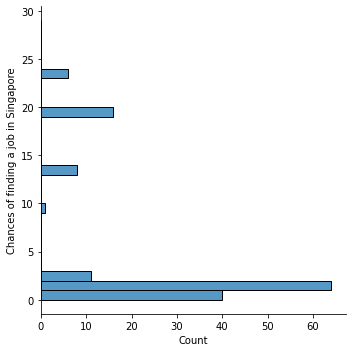

In [138]:
sns.displot(data=r99, y='Chances of finding a job in Singapore', bins=[l for l in range(30)], kind='hist')

In [139]:
r99['Chances of finding a job in Singapore'].isna().sum()

901

### The work drawbacks & limitations are documented in the final report. 

# ---------------------------------------------------------------------------------------------------------------


#  Is it possible for computer science employee to work for a company from a country different from his country residence?

In [140]:
arr = df30['Yearly brutto salary (without bonus and stocks) in EUR'].to_numpy()
arr

array([80000., 80000., 54000., ..., 70000., 38350., 65000.])

In [141]:
#convert type of the column to object to match the anthor dataset 
arr = arr.astype(object)
df30['Yearly brutto salary (without bonus and stocks) in EUR']=arr

In [142]:
df30['Company size'].value_counts()
df30.drop(['Сontract duration'], axis=1, inplace=True)

In [143]:
#changing the the record of company size to be the same format for both datasets
df30['Company size'] = df30['Company size'].replace('up to 10','"S"')
df30['Company size'] = df30['Company size'].replace('51-100','"S"')
df30['Company size'] = df30['Company size'].replace('101-1000','"M"')
df30['Company size'] = df30['Company size'].replace('101-1000','"M"')
df30['Company size'] = df30['Company size'].replace('1000+','"L"')

In [144]:
#request the page
headers = {'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3'}
url='https://huggingface.co/datasets/hugginglearners/data-science-job-salaries'
spaceWeather = requests.get(url,headers=headers)

In [145]:
# Getting the text from the page and use BS4 to parse it
spaceWeather_text = spaceWeather.text
spaceWeather_page = BeautifulSoup(spaceWeather_text,'html.parser')

In [146]:
# Showing first 1000 element in the text
spaceWeather_page.prettify()[:1000]

'<!DOCTYPE html>\n<html class="">\n <head>\n  <meta charset="utf-8"/>\n  <meta content="width=device-width, initial-scale=1.0, user-scalable=no" name="viewport"/>\n  <meta content="We’re on a journey to advance and democratize artificial intelligence through open source and open science." name="description"/>\n  <meta content="1321688464574422" property="fb:app_id"/>\n  <meta content="summary_large_image" name="twitter:card"/>\n  <meta content="@huggingface" name="twitter:site"/>\n  <meta content="hugginglearners/data-science-job-salaries · Datasets at Hugging Face" property="og:title"/>\n  <meta content="website" property="og:type"/>\n  <meta content="https://huggingface.co/datasets/hugginglearners/data-science-job-salaries" property="og:url"/>\n  <meta content="https://cdn-thumbnails.huggingface.co/social-thumbnails/datasets/hugginglearners/data-science-job-salaries.png" property="og:image"/>\n  <link href="/front/build/style.d242e2fdc.css" rel="stylesheet"/>\n  <link href="https://f

In [147]:
#retrieve the table that contains the data 
len(spaceWeather_page.find('table'))

3

In [148]:
#found the required table with this class name
class_='w-full table-auto rounded-lg font-mono text-xs text-gray-900'
table = spaceWeather_page.find('table',attrs={'class':class_})
table

<table class="w-full table-auto rounded-lg font-mono text-xs text-gray-900"><thead class="sticky top-0 left-0 right-0 z-10 bg-white shadow-sm"><tr class="space-y-54 divide-x border-b text-left"><th class="max-w-sm p-2 text-right">Unnamed: 0 (int64)</th><th class="max-w-sm p-2 text-right">work_year (int64)</th><th class="max-w-sm p-2 text-left">experience_level (string)</th><th class="max-w-sm p-2 text-left">employment_type (string)</th><th class="max-w-sm p-2 text-left">job_title (string)</th><th class="max-w-sm p-2 text-right">salary (int64)</th><th class="max-w-sm p-2 text-left">salary_currency (string)</th><th class="max-w-sm p-2 text-right">salary_in_usd (int64)</th><th class="max-w-sm p-2 text-left">employee_residence (string)</th><th class="max-w-sm p-2 text-right">remote_ratio (int64)</th><th class="max-w-sm p-2 text-left">company_location (string)</th><th class="max-w-sm p-2 text-left">company_size (string)</th></tr></thead>
<tbody class="h-16 overflow-scroll"><tr class="group 

In [149]:
#type of the table
type(table)

bs4.element.Tag

In [150]:
#Printing the table headers
table.find_all('th')

[<th class="max-w-sm p-2 text-right">Unnamed: 0 (int64)</th>,
 <th class="max-w-sm p-2 text-right">work_year (int64)</th>,
 <th class="max-w-sm p-2 text-left">experience_level (string)</th>,
 <th class="max-w-sm p-2 text-left">employment_type (string)</th>,
 <th class="max-w-sm p-2 text-left">job_title (string)</th>,
 <th class="max-w-sm p-2 text-right">salary (int64)</th>,
 <th class="max-w-sm p-2 text-left">salary_currency (string)</th>,
 <th class="max-w-sm p-2 text-right">salary_in_usd (int64)</th>,
 <th class="max-w-sm p-2 text-left">employee_residence (string)</th>,
 <th class="max-w-sm p-2 text-right">remote_ratio (int64)</th>,
 <th class="max-w-sm p-2 text-left">company_location (string)</th>,
 <th class="max-w-sm p-2 text-left">company_size (string)</th>]

In [151]:
#split the data into lists
unnamed = []
work_year = []
experience_level = []
employment_type = []
job_title = []
salary = []
salary_currency = []
salary_in_usd = []
employee_residence = []
remote_ratio = []
company_location = [] 
company_size = []

rows = table.find_all('tr')
rows[:3]

[<tr class="space-y-54 divide-x border-b text-left"><th class="max-w-sm p-2 text-right">Unnamed: 0 (int64)</th><th class="max-w-sm p-2 text-right">work_year (int64)</th><th class="max-w-sm p-2 text-left">experience_level (string)</th><th class="max-w-sm p-2 text-left">employment_type (string)</th><th class="max-w-sm p-2 text-left">job_title (string)</th><th class="max-w-sm p-2 text-right">salary (int64)</th><th class="max-w-sm p-2 text-left">salary_currency (string)</th><th class="max-w-sm p-2 text-right">salary_in_usd (int64)</th><th class="max-w-sm p-2 text-left">employee_residence (string)</th><th class="max-w-sm p-2 text-right">remote_ratio (int64)</th><th class="max-w-sm p-2 text-left">company_location (string)</th><th class="max-w-sm p-2 text-left">company_size (string)</th></tr>,
 <tr class="group space-x-4 divide-x border-b last:border-none odd:bg-gray-50 hover:cursor-pointer hover:bg-gray-100 focus:bg-gradient-to-b focus:from-blue-100 focus:to-blue-50 focus:odd:bg-white dark:o

In [152]:
#printing table content (columns)
i = 0 
for row in rows:
    if i == 0: 
        i += 1
        continue
    cols = row.find_all('td')
    print(cols)
    break

[<td class="max-w-sm break-words p-2 group-focus:align-top"><div class="line-clamp-2 group-focus:line-clamp-none"><div class="text-right" dir="auto">0</div></div>
</td>, <td class="max-w-sm break-words p-2 group-focus:align-top"><div class="line-clamp-2 group-focus:line-clamp-none"><div class="text-right" dir="auto">2,020</div></div>
</td>, <td class="max-w-sm break-words p-2 group-focus:align-top"><div class="line-clamp-2 group-focus:line-clamp-none"><div class="" dir="auto">"MI"</div></div>
</td>, <td class="max-w-sm break-words p-2 group-focus:align-top"><div class="line-clamp-2 group-focus:line-clamp-none"><div class="" dir="auto">"FT"</div></div>
</td>, <td class="max-w-sm break-words p-2 group-focus:align-top"><div class="line-clamp-2 group-focus:line-clamp-none"><div class="" dir="auto">"Data Scientist"</div></div>
</td>, <td class="max-w-sm break-words p-2 group-focus:align-top"><div class="line-clamp-2 group-focus:line-clamp-none"><div class="text-right" dir="auto">70,000</div

In [153]:
#Get columns in their order and get the length of the columns
i = 0 
for row in rows:
    if i == 0: 
        i += 1
        continue
    cols = row.find_all('td')
    unnamed.append(cols[0].text.strip())
    work_year.append(cols[1].text.strip())
    experience_level.append(cols[2].text.strip())
    employment_type.append(cols[3].text.strip())
    job_title.append(cols[4].text.strip())
    salary.append(cols[5].text.strip())
    salary_currency.append(cols[6].text.strip())
    salary_in_usd.append(cols[7].text.strip())
    employee_residence.append(cols[8].text.strip())
    remote_ratio.append(cols[9].text.strip())
    company_location.append(cols[10].text.strip())
    company_size.append(cols[11].text.strip())
    
len(unnamed), len(work_year), len(experience_level), len(employment_type), len(job_title), len(salary), len(salary_currency), len( salary_in_usd), len(employee_residence), len(remote_ratio), len(company_location), len(company_size)

(100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100)

In [154]:
# create a dataframe
spaceWeatherDataFrame = pd.DataFrame({'Rank':unnamed,'Timestamp':work_year,'Seniority level':experience_level,'Employment status':employment_type,'Position ':job_title,'Yearly brutto salary (without bonus and stocks) in EUR':salary,'salary':salary_currency,'Salary':salary_in_usd,'City':employee_residence,'remote_ratio':remote_ratio,'company_location':company_location,'Company size':company_size})
spaceWeatherDataFrame

,Rank,Timestamp,Seniority level,Employment status,Position,Yearly brutto salary (without bonus and stocks) in EUR,salary,Salary,City,remote_ratio,company_location,Company size
0,0,"2,020","""MI""","""FT""","""Data Scientist""","70,000","""EUR""","79,833","""DE""",0,"""DE""","""L"""
1,1,"2,020","""SE""","""FT""","""Machine Learning Scientist""","260,000","""USD""","260,000","""JP""",0,"""JP""","""S"""
2,2,"2,020","""SE""","""FT""","""Big Data Engineer""","85,000","""GBP""","109,024","""GB""",50,"""GB""","""M"""
3,3,"2,020","""MI""","""FT""","""Product Data Analyst""","20,000","""USD""","20,000","""HN""",0,"""HN""","""S"""
4,4,"2,020","""SE""","""FT""","""Machine Learning Engineer""","150,000","""USD""","150,000","""US""",50,"""US""","""L"""
5,5,"2,020","""EN""","""FT""","""Data Analyst""","72,000","""USD""","72,000","""US""",100,"""US""","""L"""
6,6,"2,020","""SE""","""FT""","""Lead Data Scientist""","190,000","""USD""","190,000","""US""",100,"""US""","""S"""
7,7,"2,020","""MI""","""FT""","""Data Scientist""","11,000,000","""HUF""","35,735","""HU""",50,"""HU""","""L"""
8,8,"2,020","""MI""","""FT""","""Business Data Analyst""","135,000","""USD""","135,000","""US""",100,"""US""","""L"""
9,9,"2,020","""SE""","""FT""","""Lead Data Engineer""","125,000","""USD""","125,000","""NZ""",50,"""NZ""","""S"""


In [155]:
#Drop unnesscery columns 
dfsaad=spaceWeatherDataFrame.drop(['Rank', 'remote_ratio','salary','Salary'],axis=1).copy()
dfsaad

,Timestamp,Seniority level,Employment status,Position,Yearly brutto salary (without bonus and stocks) in EUR,City,company_location,Company size
0,"2,020","""MI""","""FT""","""Data Scientist""","70,000","""DE""","""DE""","""L"""
1,"2,020","""SE""","""FT""","""Machine Learning Scientist""","260,000","""JP""","""JP""","""S"""
2,"2,020","""SE""","""FT""","""Big Data Engineer""","85,000","""GB""","""GB""","""M"""
3,"2,020","""MI""","""FT""","""Product Data Analyst""","20,000","""HN""","""HN""","""S"""
4,"2,020","""SE""","""FT""","""Machine Learning Engineer""","150,000","""US""","""US""","""L"""
5,"2,020","""EN""","""FT""","""Data Analyst""","72,000","""US""","""US""","""L"""
6,"2,020","""SE""","""FT""","""Lead Data Scientist""","190,000","""US""","""US""","""S"""
7,"2,020","""MI""","""FT""","""Data Scientist""","11,000,000","""HU""","""HU""","""L"""
8,"2,020","""MI""","""FT""","""Business Data Analyst""","135,000","""US""","""US""","""L"""
9,"2,020","""SE""","""FT""","""Lead Data Engineer""","125,000","""NZ""","""NZ""","""S"""


In [156]:
dfsaad.dtypes

Timestamp                                                 object
Seniority level                                           object
Employment status                                         object
Position                                                  object
Yearly brutto salary (without bonus and stocks) in EUR    object
City                                                      object
company_location                                          object
Company size                                              object
dtype: object

In [157]:
#changing the the record of Seniorty level,employment status and timestamp to be the same format for both datasets
dfsaad['Seniority level'] = dfsaad['Seniority level'].replace('"MI"','Middle')
dfsaad['Seniority level'] = dfsaad['Seniority level'].replace('"SE"','Senior')
dfsaad['Seniority level'] = dfsaad['Seniority level'].replace('"EN"','Entiry level')
dfsaad['Seniority level'] = dfsaad['Seniority level'].replace('"EX"','Expert')
dfsaad['Employment status'] = dfsaad['Employment status'].replace('"FT"','Full-time employee')
dfsaad['Employment status'] = dfsaad['Employment status'].replace('"PT"','Part-time employee')
dfsaad['Timestamp'] = dfsaad['Timestamp'].replace('2,020','2020')
dfsaad

,Timestamp,Seniority level,Employment status,Position,Yearly brutto salary (without bonus and stocks) in EUR,City,company_location,Company size
0,2020,Middle,Full-time employee,"""Data Scientist""","70,000","""DE""","""DE""","""L"""
1,2020,Senior,Full-time employee,"""Machine Learning Scientist""","260,000","""JP""","""JP""","""S"""
2,2020,Senior,Full-time employee,"""Big Data Engineer""","85,000","""GB""","""GB""","""M"""
3,2020,Middle,Full-time employee,"""Product Data Analyst""","20,000","""HN""","""HN""","""S"""
4,2020,Senior,Full-time employee,"""Machine Learning Engineer""","150,000","""US""","""US""","""L"""
5,2020,Entiry level,Full-time employee,"""Data Analyst""","72,000","""US""","""US""","""L"""
6,2020,Senior,Full-time employee,"""Lead Data Scientist""","190,000","""US""","""US""","""S"""
7,2020,Middle,Full-time employee,"""Data Scientist""","11,000,000","""HU""","""HU""","""L"""
8,2020,Middle,Full-time employee,"""Business Data Analyst""","135,000","""US""","""US""","""L"""
9,2020,Senior,Full-time employee,"""Lead Data Engineer""","125,000","""NZ""","""NZ""","""S"""


In [158]:
#Create new columns called equal has the data about who lives in the same country of his company and who is not
dfsaad['equal'] = dfsaad['City'] == dfsaad['company_location']
dfsaad

,Timestamp,Seniority level,Employment status,Position,Yearly brutto salary (without bonus and stocks) in EUR,City,company_location,Company size,equal
0,2020,Middle,Full-time employee,"""Data Scientist""","70,000","""DE""","""DE""","""L""",True
1,2020,Senior,Full-time employee,"""Machine Learning Scientist""","260,000","""JP""","""JP""","""S""",True
2,2020,Senior,Full-time employee,"""Big Data Engineer""","85,000","""GB""","""GB""","""M""",True
3,2020,Middle,Full-time employee,"""Product Data Analyst""","20,000","""HN""","""HN""","""S""",True
4,2020,Senior,Full-time employee,"""Machine Learning Engineer""","150,000","""US""","""US""","""L""",True
5,2020,Entiry level,Full-time employee,"""Data Analyst""","72,000","""US""","""US""","""L""",True
6,2020,Senior,Full-time employee,"""Lead Data Scientist""","190,000","""US""","""US""","""S""",True
7,2020,Middle,Full-time employee,"""Data Scientist""","11,000,000","""HU""","""HU""","""L""",True
8,2020,Middle,Full-time employee,"""Business Data Analyst""","135,000","""US""","""US""","""L""",True
9,2020,Senior,Full-time employee,"""Lead Data Engineer""","125,000","""NZ""","""NZ""","""S""",True


In [159]:
# merge two datasets with outer merge 
dfsaad2=pd.merge(df30, dfsaad, how='outer') 
dfsaad2

D:\Programs\Anaconda\lib\site-packages\pandas\core\reshape\merge.py:916: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  key_col = Index(lvals).where(~mask_left, rvals)


,Timestamp,Age,Gender,City,Position,Total years of experience,Seniority level,Yearly brutto salary (without bonus and stocks) in EUR,Yearly bonus + stocks in EUR,Employment status,Main language at work,Company size,Company type,Have you lost your job due to the coronavirus outbreak?,company_location,equal
0,24/11/2020 11:14:15,26.00,Male,Munich,Software Engineer,5,Senior,80000.00,5000,Full-time employee,English,"""S""",Product,No,NaN,NaN
1,24/11/2020 11:14:16,26.00,Male,Berlin,Backend Developer,7,Senior,80000.00,0,Full-time employee,English,"""M""",Product,No,NaN,NaN
2,24/11/2020 11:15:24,28.00,Male,Berlin,Frontend Developer,4,Junior,54000.00,0,Full-time employee,English,"""S""",Startup,No,NaN,NaN
3,24/11/2020 11:15:46,37.00,Male,Berlin,Backend Developer,17,Senior,62000.00,0,Full-time employee,English,"""M""",Product,No,NaN,NaN
4,24/11/2020 11:15:53,32.00,Male,Berlin,DevOps,5,Senior,76000.00,5000,Full-time employee,English,Nov-50,Startup,No,NaN,NaN
5,24/11/2020 11:16:35,37.00,Male,Berlin,Frontend Developer,6,Middle,57000.00,0,Full-time employee,English,Nov-50,Product,No,NaN,NaN
6,24/11/2020 11:16:44,24.00,Male,Berlin,Frontend Developer,5,Senior,65000.00,0,Full-time employee,English,"""L""",Product,No,NaN,NaN
7,24/11/2020 11:17:24,29.00,Male,Berlin,Backend Developer,8,Senior,56000.00,0,Full-time employee,English,"""M""",Product,No,NaN,NaN
8,24/11/2020 11:17:50,35.00,Male,Berlin,Software Engineer,15,Lead,95000.00,0,Full-time employee,English,"""M""",Product,No,NaN,NaN
9,24/11/2020 11:18:06,32.00,Female,Hamburg,Data Engineer,2,Junior,52500.00,0,Full-time employee,German,"""M""",Consulting / Agency,No,NaN,NaN


In [160]:
#Dealing with null values
dfsaad2['Have you lost your job due to the coronavirus outbreak?'] = dfsaad2['Have you lost your job due to the coronavirus outbreak?'].fillna('didnot answer')
dfsaad2['company_location'] = dfsaad2['company_location'].fillna('no info')
dfsaad2['Yearly bonus + stocks in EUR'] = dfsaad2['Yearly bonus + stocks in EUR'].fillna(0)
dfsaad2['Total years of experience'] = dfsaad2['Total years of experience'].fillna('no info')
dfsaad2

,Timestamp,Age,Gender,City,Position,Total years of experience,Seniority level,Yearly brutto salary (without bonus and stocks) in EUR,Yearly bonus + stocks in EUR,Employment status,Main language at work,Company size,Company type,Have you lost your job due to the coronavirus outbreak?,company_location,equal
0,24/11/2020 11:14:15,26.00,Male,Munich,Software Engineer,5,Senior,80000.00,5000,Full-time employee,English,"""S""",Product,No,no info,NaN
1,24/11/2020 11:14:16,26.00,Male,Berlin,Backend Developer,7,Senior,80000.00,0,Full-time employee,English,"""M""",Product,No,no info,NaN
2,24/11/2020 11:15:24,28.00,Male,Berlin,Frontend Developer,4,Junior,54000.00,0,Full-time employee,English,"""S""",Startup,No,no info,NaN
3,24/11/2020 11:15:46,37.00,Male,Berlin,Backend Developer,17,Senior,62000.00,0,Full-time employee,English,"""M""",Product,No,no info,NaN
4,24/11/2020 11:15:53,32.00,Male,Berlin,DevOps,5,Senior,76000.00,5000,Full-time employee,English,Nov-50,Startup,No,no info,NaN
5,24/11/2020 11:16:35,37.00,Male,Berlin,Frontend Developer,6,Middle,57000.00,0,Full-time employee,English,Nov-50,Product,No,no info,NaN
6,24/11/2020 11:16:44,24.00,Male,Berlin,Frontend Developer,5,Senior,65000.00,0,Full-time employee,English,"""L""",Product,No,no info,NaN
7,24/11/2020 11:17:24,29.00,Male,Berlin,Backend Developer,8,Senior,56000.00,0,Full-time employee,English,"""M""",Product,No,no info,NaN
8,24/11/2020 11:17:50,35.00,Male,Berlin,Software Engineer,15,Lead,95000.00,0,Full-time employee,English,"""M""",Product,No,no info,NaN
9,24/11/2020 11:18:06,32.00,Female,Hamburg,Data Engineer,2,Junior,52500.00,0,Full-time employee,German,"""M""",Consulting / Agency,No,no info,NaN


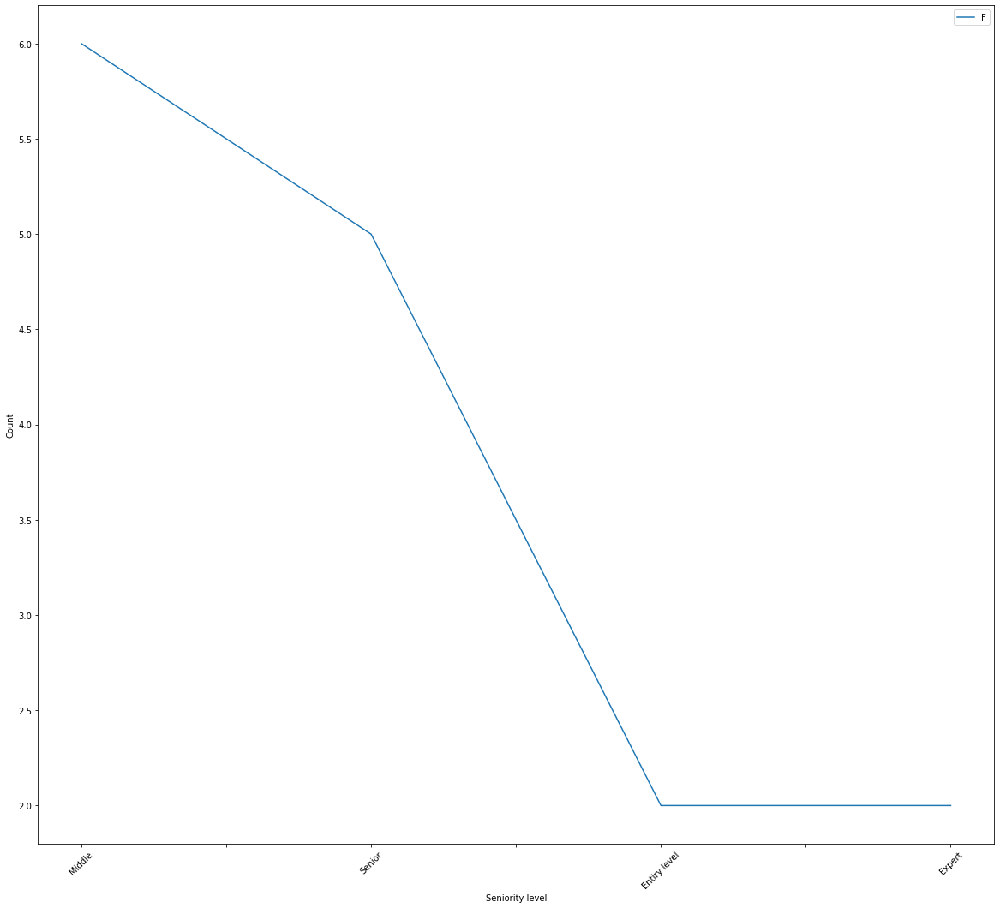

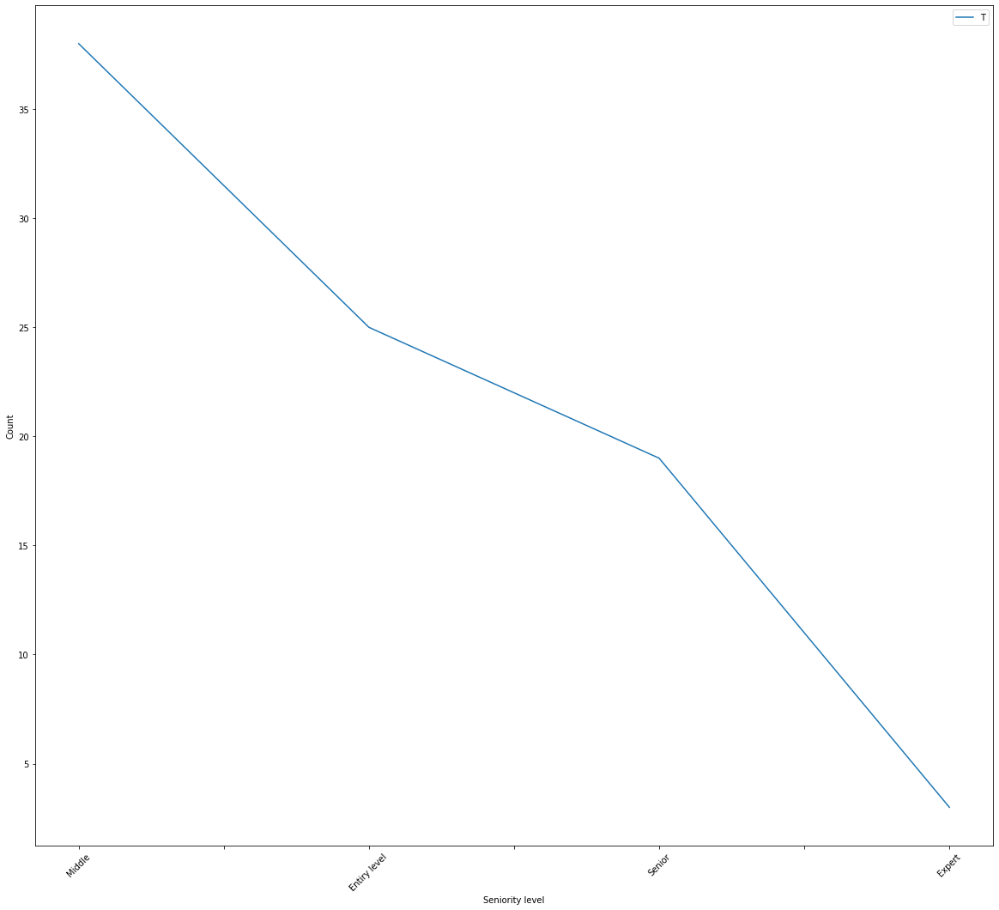

In [218]:
#Show the number of employees who lives in the same country of his company and who is not regarding to the Seniority level.
counts = dfsaad2["Seniority level"].groupby(dfsaad2["equal"]).value_counts()
#plotting False
plt.figure()
counts[0].plot(rot=45)
plt.legend("False")
plt.ylabel('Count', fontsize=10)

#plotting True
plt.figure()
counts[1].plot(rot=45)
plt.ylabel('Count', fontsize=10)
plt.legend("True")

### From The previos graph and the analyzed of the dataset it possible to work for a company from different country the place of employee residence specifically middles and Seniors employee have a good chance

# ---------------------------------------------------------------------------------------------------------------